### First, we will load the modules and inference data, define some settings, and perform a small amount of preprocessing

In [1]:
import pandas as pd
import matplotlib
import warnings
import os
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
import analysis_utils
from copy import deepcopy

# path to repository folder (data is stored here as well)
path = '..'
preds_loc = os.path.join(path, 'data', 'analysis', 'korpm_analysis.csv')

# default plotting settings
font = {'size'   : 18}
matplotlib.rc('font', **font)

# notebook display options
warnings.filterwarnings('ignore')
pd.options.display.max_rows = 300

remap_names = analysis_utils.remap_names
remap_names_2 = analysis_utils.remap_names_2

db = pd.read_csv(preds_loc).set_index(['uid', 'uid2'])

Original unique mutations: 2369
['mif_dir', 'mifst_dir', 'mpnn_10_00_dir', 'mpnn_20_00_dir', 'mpnn_30_00_dir', 'esmif_multimer_dir', 'esm2_3B_dir', 'esmif_monomer_dir', 'esm2_15B_half_dir', 'msa_1_dir', 'msa_2_dir', 'msa_3_dir', 'msa_4_dir', 'msa_5_dir', 'msa_transformer_median_dir', 'msa_transformer_mean_dir', 'tranception_dir', 'esm2_150M_dir', 'esm2_650M_dir', 'ankh_dir', 'esm1v_1_dir', 'esm1v_2_dir', 'esm1v_3_dir', 'esm1v_4_dir', 'esm1v_5_dir', 'esm1v_median_dir', 'esm1v_mean_dir', 'korpm_dir', 'cartesian_ddg_dir']
['mif_dir', 'mifst_dir', 'mpnn_10_00_dir', 'mpnn_20_00_dir', 'mpnn_30_00_dir', 'esmif_multimer_dir', 'esm2_3B_dir', 'esmif_monomer_dir', 'esm2_15B_half_dir', 'msa_transformer_median_dir', 'msa_transformer_mean_dir', 'tranception_dir', 'esm2_150M_dir', 'esm2_650M_dir', 'ankh_dir', 'esm1v_median_dir', 'esm1v_mean_dir', 'korpm_dir', 'cartesian_ddg_dir']
Detected 40 interface mutations


,,mif_dir,mifst_dir,mpnn_10_00_dir,mpnn_20_00_dir,mpnn_30_00_dir,esmif_multimer_dir,esm2_3B_dir,esmif_monomer_dir,esm2_15B_half_dir,msa_1_dir,...,esm1v_5_dir,esm1v_median_dir,esm1v_mean_dir,korpm_dir,cartesian_ddg_dir,ddG,cluster,mpnn_rosetta_dir,random_dir,ddG_dir
uid,uid2,,,,,,,,,,,,,,,,,,,,,
12CA_145R,12CA_140R,-7.472339,-11.654044,-0.754203,-1.014478,0.222601,0.000611,-13.121611,0.000611,-10.045898,-11.081309,...,-13.287169,-10.042923,-10.626349,0.862,-10.880333,-0.36,22,-11.894811,-0.850018,-0.36
1A23_30S,1A23_30S,1.864485,-6.805952,1.862225,2.087240,-1.396025,-0.043713,-11.571676,-0.043713,-11.668701,-8.721450,...,-13.370916,-13.370916,-13.061886,-0.241,-1.567467,-1.80,34,0.519773,0.784381,-1.80
1A23_32L,1A23_32L,1.119251,-7.800102,-0.200148,2.129448,-0.085721,-0.042389,-13.755667,-0.042389,-13.076172,-7.793007,...,-11.998137,-11.998137,-12.214681,0.365,1.773667,-4.60,34,3.903115,-0.046428,-4.60
1A23_32S,1A23_32S,-0.854073,-5.414868,0.188699,0.849972,0.863521,-0.029983,-8.291791,-0.029983,-10.436035,-5.083358,...,-8.345301,-6.640480,-6.917703,-0.181,-2.198333,-5.20,34,-1.348361,-0.340739,-5.20
1A23_33S,1A23_33S,0.348253,-5.093968,0.965242,-0.514806,0.980866,-0.024960,-12.002896,-0.024961,-12.722168,-7.606897,...,-12.898417,-7.950251,-9.768216,-0.848,0.794333,-1.10,34,0.279527,0.771216,-1.10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5TR5_33Q,5TR5_33Q,-0.197353,-0.914865,-0.652905,-0.046959,0.548482,-0.000270,-1.666809,-0.000271,-1.537109,-3.267214,...,-6.592246,-3.193152,-3.695140,-0.228,1.595667,-0.65,47,1.548708,-1.790528,-0.65
5TR5_37L,5TR5_37L,-7.014242,-4.624759,-2.038346,-2.644756,-1.633662,-0.141230,-3.879099,-0.141230,-4.250977,-7.255979,...,-1.950832,-3.141888,-3.432956,-0.952,0.726333,-0.29,47,-1.918423,0.406474,-0.29
5TR5_55I,5TR5_55I,-3.645788,-3.215672,-3.165476,-3.178130,-2.039948,-0.014492,-0.803307,-0.014492,-1.160156,-6.826414,...,-3.179624,-4.646410,-4.617338,-0.128,-0.450000,0.24,47,-3.628130,0.860098,0.24


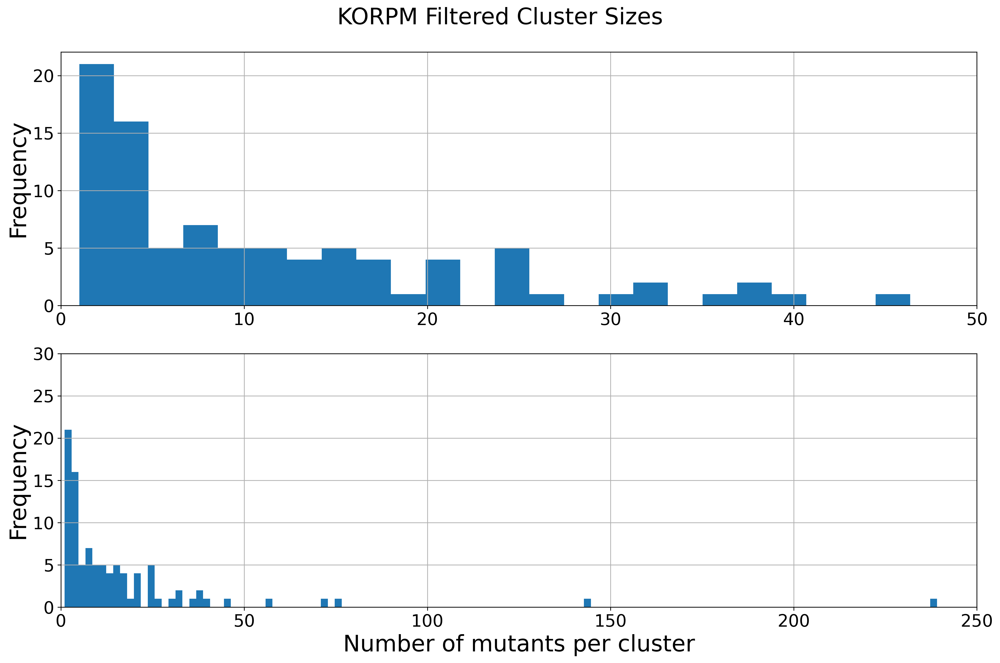

In [2]:
db_class = db

print('Original unique mutations:', len(db_class))

evolutionary = ['tranception', 'msa_transformer', 'esm1v', 'msa', 'esm2', 'ankh']
structural = ['mpnn', 'mif', 'mifst', 'esmif', 'mutcomputex']
supervised = ['MAESTRO', 'ThermoNet', 'INPS', 'PremPS', 'mCSM', 'DUET', 'ACDC', 'I-Mutant3.0', 'SAAFEC', 'MuPro', 'q3421']
untrained = ['DDGun']
potential = ['KORPM', 'PopMusic', 'SDM', 'korpm']
biophysical = ['cartesian_ddg', 'FoldX', 'Evo', 'Cartddg']
transfer = ['stability-oracle']

original_pred_cols = db_class.columns[db_class.columns.str.contains('|'.join(evolutionary + structural + supervised + untrained + potential + biophysical + transfer))]
original_pred_cols = list(original_pred_cols.drop(['reduced_msa_file', 'full_msa_file', 'tranception_dms', 'msa_weights']))
original_pred_cols = [c for c in original_pred_cols if not 'runtime' in c]
original_pred_cols = [c for c in original_pred_cols if not 'cluster' in c]
original_pred_cols = [c for c in original_pred_cols if not 'overlaps' in c]
original_pred_cols = [c for c in original_pred_cols if not 'pll' in c]
print(original_pred_cols)

db_runtimes = db[[c for c in db.columns if 'runtime' in c]]

original_pred_cols_reduced = deepcopy(original_pred_cols)
for col in [f'esm1v_{i}_dir' for i in range(1,6)]:
    original_pred_cols_reduced.remove(col)
for col in [f'msa_{i}_dir' for i in range(1,6)]:
    original_pred_cols_reduced.remove(col)

print(original_pred_cols_reduced)

db_class = db_class[original_pred_cols + ['ddG', 'cluster']]

db_class_rescaled = db_class.copy(deep=True)
db_class_rescaled[original_pred_cols] /= db_class_rescaled[original_pred_cols].std()

db_class['mpnn_rosetta_dir'] = db_class['cartesian_ddg_dir'] + db_class['mpnn_20_00_dir']
db_class['random_dir'] = np.random.normal(loc=0, size=len(db_class))
#db_class['korpm_dir'] = db_class['KORPMD_dir']
db_class['ddG_dir'] = db_class['ddG']

#db_class = db_class.drop([c+'_dir' for c in ['ACDCNND', 'FoldXD', 'DDGunD', 'CartddgD']], axis=1) #'PopMsD', 'TNetD'

print(f'Detected {len(db_class.loc[db["on_interface_dir"].astype(bool)])} interface mutations')

fig, axes = plt.subplots(2, figsize=(15, 10), dpi=300) 

db_class.groupby('cluster').count().iloc[:, 0].hist(bins=400, ax=axes[0])
axes[0].set_xlim([0, 50])  # Set x-axis limits for the first plot
axes[0].tick_params(axis='x', labelsize=18)  # Set x-tick label size for the first plot
axes[0].set_ylabel('Frequency', fontsize=24)  # Set y-label for the first plot

# Second plot
db_class.groupby('cluster').count().iloc[:, 0].hist(bins=400, ax=axes[1])
axes[1].set_xlim([0, 250]) 
axes[1].set_ylim([0, 30])  # Set x-axis limits for the first plot
axes[1].set_xlabel('Number of mutants per cluster', fontsize=24) 
axes[1].set_ylabel('Frequency', fontsize=24)
axes[1].tick_params(axis='x', labelsize=18)

plt.suptitle('KORPM Filtered Cluster Sizes', fontsize=24)
plt.tight_layout()

db_class

In [3]:
# Clusters with >= or < 50 unique mutants
print((db_class.groupby('cluster').count().iloc[:, 0] >= 50).sum(), (db_class.groupby('cluster').count().iloc[:, 0] < 50).sum())

6 91


### Recursive Feature Addition (Figure 3C)

Using 1566 training observations with less than 25\% sequence identity to either Ssym or S461


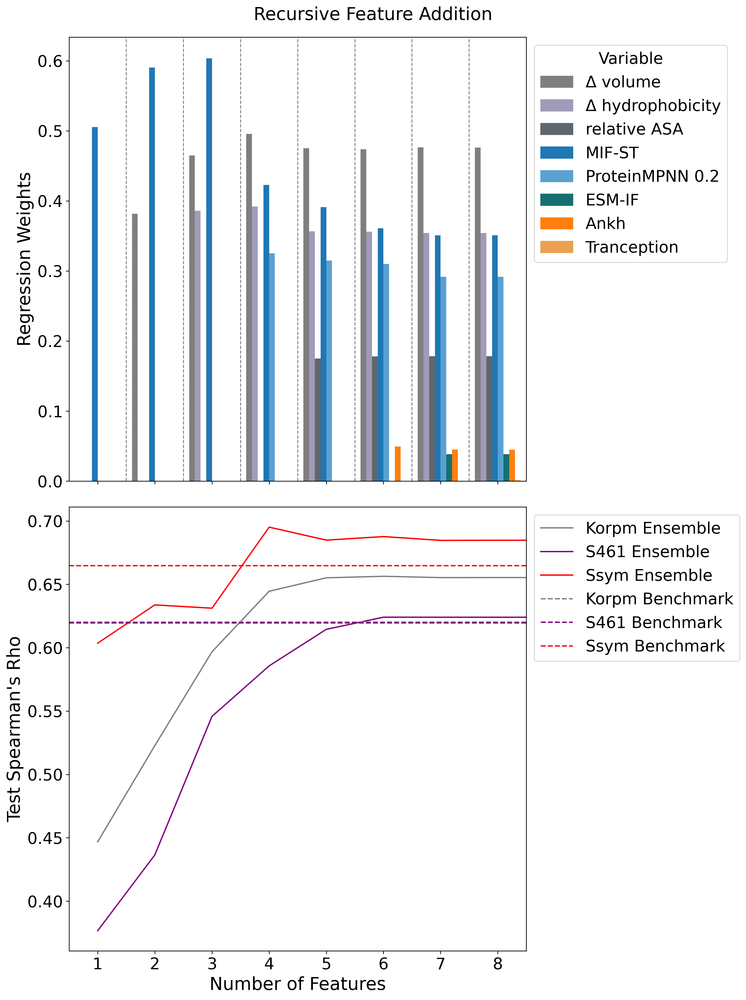

In [4]:
from sklearn.linear_model import Ridge, LinearRegression
from sklearn.kernel_ridge import KernelRidge
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler, MinMaxScaler, PolynomialFeatures
import importlib
importlib.reload(analysis_utils)

cols2 = ['delta_kdh_dir', 'delta_vol_dir', 'rel_ASA_dir', 'esmif_multimer_dir', 'mpnn_20_00_dir', 'mif_dir', 'mifst_dir', 'msa_transformer_mean_dir', 'esm2_650M_dir', 'ankh_dir', 'tranception_dir'] #'mutcomputex_dir',
df_train = db.drop(['cluster','ddG'], axis=1).fillna(0) #.join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0)
df_train = df_train.loc[~df_train['overlaps_seq_ssym']].loc[~df_train['overlaps_seq_s461']]
print('Using', len(df_train), 'training observations with less than 25\% sequence identity to either Ssym or S461')
df_test = db.drop(['cluster','ddG'], axis=1).fillna(0) #.join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0).drop(['ProTherm', 'ddG'], axis=1).fillna(0)
df_test_s461 = pd.read_csv(os.path.join(path, 'data', 'analysis', 's461_analysis.csv')).set_index('uid')
df_test_s461 = df_test_s461[[c for c in df_test_s461.columns if not 'korpm' in c and not 'rfa_' in c]]
df_test_s461.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA'] else c for c in df_test_s461.columns]
df_test_ssym = pd.read_csv(os.path.join(path, 'data', 'analysis', 'ssym_analysis.csv')).set_index('uid')
df_test_ssym = df_test_ssym[[c for c in df_test_ssym.columns if not 'korpm' in c and not 'rfa_' in c]]
#df_test_ssym.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA', 'ddG'] else c for c in df_test_ssym.columns]
df_test_ssym.columns = [c+'_dir' for c in df_test_ssym.columns]

dfs_test = {'korpm': df_test, 's461': df_test_s461, 'ssym': df_test_ssym}

test_scores, weights_df, dfs_test = analysis_utils.custom_recursive_feature_addition(df_train, dfs_test, cols2, 'ddG_dir', LinearRegression(positive=True), fillna=True, source='korpm_pslm')

df_test_korpm = dfs_test['korpm']
df_test_korpm = df_test_korpm.rename(dict(zip([c for c in df_test_korpm.columns if 'rfa_' in c], [c+'_dir' for c in df_test_korpm.columns if 'rfa_' in c])), axis=1)
db_class = db_class[[c for c in db_class.columns if not 'korpm_pslm' in c]]
db_class = db_class.join(df_test_korpm[[c for c in df_test_korpm.columns if 'rfa_' in c]])

df_test_s461 = dfs_test['s461']
df_test_s461 = df_test_s461.rename(dict(zip([c for c in df_test_s461.columns if 'rfa_' in c], [c+'_dir' for c in df_test_s461.columns if 'rfa_' in c])), axis=1)
df_test_s461.to_csv(os.path.join(path, 'data', 'inference', 's461_analysis.csv'))

df_test_ssym = dfs_test['ssym']
df_test_ssym = df_test_ssym.rename(dict(zip([c for c in df_test_ssym.columns if '_dir' in c], [c[:-4] for c in df_test_ssym.columns if '_dir' in c])), axis=1)
df_test_ssym.to_csv(os.path.join(path, 'data', 'inference', 'ssym_analysis.csv'))

### Recursive Feature Addition (All Models) (Supplementary Figure 9)

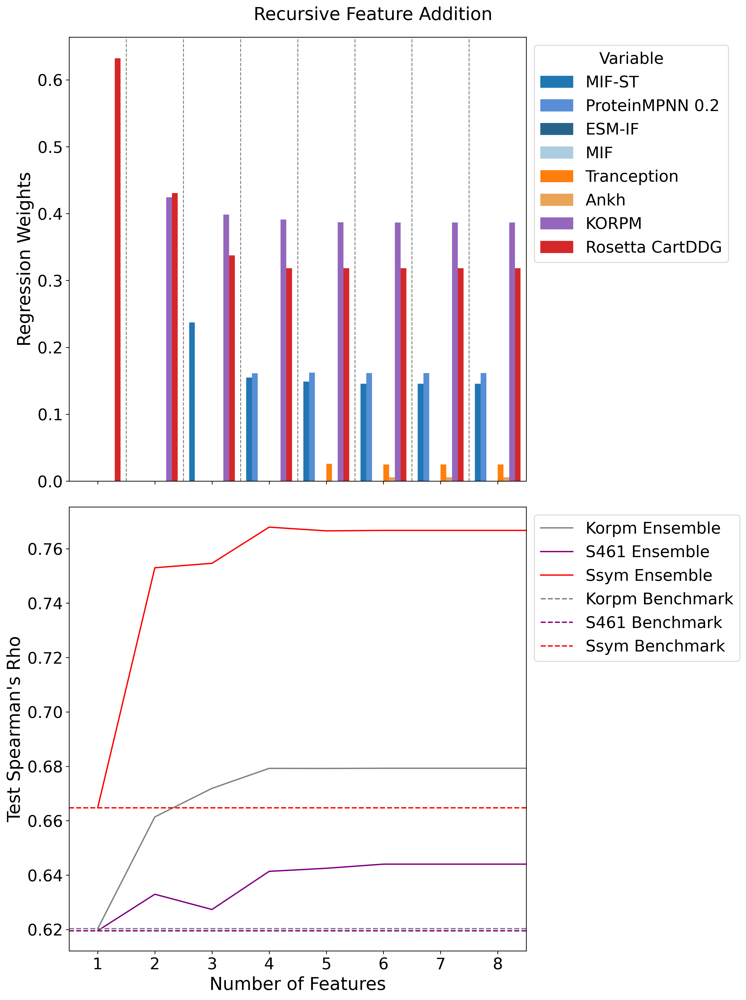

In [5]:
cols2 = ['cartesian_ddg_dir', 'korpm_dir', 'esmif_multimer_dir', 'mpnn_20_00_dir', 'mpnn_30_00_dir', 'esm2_3B_dir', 'mifst_dir', 'mif_dir', 'msa_transformer_mean_dir', 'esm2_650M_dir', 'ankh_dir', 'tranception_dir']#, 'mutcomputex_dir']
df_train = db.drop(['cluster','ddG'], axis=1).fillna(0) #.join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0)
df_train = df_train.loc[~df_train['overlaps_seq_ssym']].loc[~df_train['overlaps_seq_s461']]
df_test = db.drop(['cluster','ddG'], axis=1).fillna(0) #.join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0).drop(['ProTherm', 'ddG'], axis=1).fillna(0)
df_test_s461 = pd.read_csv(os.path.join(path, 'data', 'analysis', 's461_analysis.csv')).set_index('uid')
df_test_s461 = df_test_s461[[c for c in df_test_s461.columns if not 'korpm_all' in c]]
df_test_s461.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA'] else c for c in df_test_s461.columns]
df_test_ssym = pd.read_csv(os.path.join(path, 'data', 'analysis', 'ssym_analysis.csv')).set_index('uid')
df_test_ssym = df_test_ssym[[c for c in df_test_ssym.columns if not 'korpm_all' in c]]
#df_test_ssym.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA', 'ddG'] else c for c in df_test_ssym.columns]
df_test_ssym.columns = [c+'_dir' for c in df_test_ssym.columns]

dfs_test = {'korpm': df_test, 's461': df_test_s461, 'ssym': df_test_ssym}

test_scores, weights_df, dfs_test = analysis_utils.custom_recursive_feature_addition(df_train, dfs_test, cols2, 'ddG_dir', LinearRegression(positive=True), fillna=True, source='korpm_all')

df_test_korpm = dfs_test['korpm']
df_test_korpm = df_test_korpm.rename(dict(zip([c for c in df_test_korpm.columns if 'rfa_' in c], [c+'_dir' for c in df_test_korpm.columns if 'rfa_' in c])), axis=1)
db_class = db_class[[c for c in db_class.columns if not 'korpm_all' in c]]
db_class = db_class.join(df_test_korpm[[c for c in df_test_korpm.columns if 'rfa_' in c]])

df_test_s461 = dfs_test['s461']
df_test_s461 = df_test_s461.rename(dict(zip([c for c in df_test_s461.columns if 'rfa_' in c], [c+'_dir' for c in df_test_s461.columns if 'rfa_' in c])), axis=1)
df_test_s461.to_csv(os.path.join(path, 'data', 'analysis', 's461_analysis.csv'))

df_test_ssym = dfs_test['ssym']
df_test_ssym = df_test_ssym.rename(dict(zip([c for c in df_test_ssym.columns if '_dir' in c], [c[:-4] for c in df_test_ssym.columns if '_dir' in c])), axis=1)
df_test_ssym.to_csv(os.path.join(path, 'data', 'analysis', 'ssym_analysis.csv'))

In [6]:
drop_cols = [c for c in db_class.columns if 'korpm_pslm' in c and not '5' in c]
drop_cols += [c for c in db_class.columns if 'korpm_all' in c and not '5' in c]
db_class = db_class.drop(drop_cols, axis=1)
db_class

,,mif_dir,mifst_dir,mpnn_10_00_dir,mpnn_20_00_dir,mpnn_30_00_dir,esmif_multimer_dir,esm2_3B_dir,esmif_monomer_dir,esm2_15B_half_dir,msa_1_dir,...,esm1v_mean_dir,korpm_dir,cartesian_ddg_dir,ddG,cluster,mpnn_rosetta_dir,random_dir,ddG_dir,korpm_pslm_rfa_5_dir,korpm_all_rfa_5_dir
uid,uid2,,,,,,,,,,,,,,,,,,,,,
12CA_145R,12CA_140R,-7.472339,-11.654044,-0.754203,-1.014478,0.222601,0.000611,-13.121611,0.000611,-10.045898,-11.081309,...,-10.626349,0.862,-10.880333,-0.36,22,-11.894811,-0.850018,-0.36,-0.299253,-0.445203
1A23_30S,1A23_30S,1.864485,-6.805952,1.862225,2.087240,-1.396025,-0.043713,-11.571676,-0.043713,-11.668701,-8.721450,...,-13.061886,-0.241,-1.567467,-1.80,34,0.519773,0.784381,-1.80,-0.575849,-0.043803
1A23_32L,1A23_32L,1.119251,-7.800102,-0.200148,2.129448,-0.085721,-0.042389,-13.755667,-0.042389,-13.076172,-7.793007,...,-12.214681,0.365,1.773667,-4.60,34,3.903115,-0.046428,-4.60,0.419953,0.427284
1A23_32S,1A23_32S,-0.854073,-5.414868,0.188699,0.849972,0.863521,-0.029983,-8.291791,-0.029983,-10.436035,-5.083358,...,-6.917703,-0.181,-2.198333,-5.20,34,-1.348361,-0.340739,-5.20,-0.404675,-0.020241
1A23_33S,1A23_33S,0.348253,-5.093968,0.965242,-0.514806,0.980866,-0.024960,-12.002896,-0.024961,-12.722168,-7.606897,...,-9.768216,-0.848,0.794333,-1.10,34,0.279527,0.771216,-1.10,-0.839556,-0.260902
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5TR5_33Q,5TR5_33Q,-0.197353,-0.914865,-0.652905,-0.046959,0.548482,-0.000270,-1.666809,-0.000271,-1.537109,-3.267214,...,-3.695140,-0.228,1.595667,-0.65,47,1.548708,-1.790528,-0.65,0.128101,0.300868
5TR5_37L,5TR5_37L,-7.014242,-4.624759,-2.038346,-2.644756,-1.633662,-0.141230,-3.879099,-0.141230,-4.250977,-7.255979,...,-3.432956,-0.952,0.726333,-0.29,47,-1.918423,0.406474,-0.29,0.297722,-0.387203
5TR5_55I,5TR5_55I,-3.645788,-3.215672,-3.165476,-3.178130,-2.039948,-0.014492,-0.803307,-0.014492,-1.160156,-6.826414,...,-4.617338,-0.128,-0.450000,0.24,47,-3.628130,0.860098,0.24,0.284853,-0.072323


In [7]:
import importlib
importlib.reload(analysis_utils)
remap_names_2 = analysis_utils.remap_names_2
remap_names_2

{'esmif_monomer_dir': 'ESM-IF(M)',
 'esmif_multimer_dir': 'ESM-IF',
 'mpnn_mean_dir': 'ProteinMPNN mean',
 'esm2_mean_dir': 'ESM-2 mean',
 'esmif_mean_dir': 'ESM-IF mean',
 'mif_mean_dir': 'MIF mean',
 'msa_transformer_mean_dir': 'MSA-T mean',
 'msa_transformer_median_dir': 'MSA-T median',
 'esm1v_mean_dir': 'ESM-1V mean',
 'esm1v_median_dir': 'ESM-1V median',
 'esm2_150M_dir': 'ESM-2 150M',
 'esm2_650M_dir': 'ESM-2 650M',
 'esm2_3B_dir': 'ESM-2 3B',
 'esm2_15B_half_dir': 'ESM-2 15B',
 'mif_dir': 'MIF',
 'mifst_dir': 'MIF-ST',
 'monomer_ddg_dir': 'Ros_ddG_monomer',
 'cartesian_ddg_dir': 'Rosetta CartDDG',
 'mpnn_10_00_dir': 'ProteinMPNN 0.1',
 'mpnn_20_00_dir': 'ProteinMPNN 0.2',
 'mpnn_30_00_dir': 'ProteinMPNN 0.3',
 'mpnn_sol_10_00_dir': 'ProteinMPNN_sol 0.1',
 'mpnn_sol_20_00_dir': 'ProteinMPNN_sol 0.2',
 'mpnn_sol_30_00_dir': 'ProteinMPNN_sol 0.3',
 'tranception_dir': 'Tranception',
 'tranception_weights_dir': 'Tranception reweighted',
 'tranception_original_dir': 'Tranception_orig

### Non-bootstrapped Analysis of KORPM Filtered (not in text)

In [8]:
# TABLE 1
# Note: due to changes in the dependencies and small changes to preprocessing,
# results have changed very slightly from the current revision, but do not affect
# the interpretation of results or conclusions

# could replace stats=() with ('n', 'MCC', 'auprc', 'ndcg', 'spearman')
# but then you would not be saving the other stats. 
# uncomment to_csv lines to save to a custom location
#db_class['code'] = db_class.index.str[:4]
summ = analysis_utils.compute_stats(db_class, 
                                    stats=('n', 'MCC', 'pred_positives', 'tp', 'auprc', 'spearman', 'ndcg', 'mean_t1s', 'mean_reciprocal_rank', 'mean_stabilization', 'net_stabilization', 'sensitivity', 'tp', 'recall@k1.0', 'aumsc', 'auppc'), 
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=0)
rcv = summ.copy(deep=True)
#summ.to_csv('../data/extended/q3421_extended.csv')
tmp1 = summ #.loc[:,['n', 'MCC', 'auprc', 'spearman', 'weighted_ndcg', 'weighted_auprc', 'weighted_spearman']]
tmp = tmp1.sort_values(['measurement', 'weighted_spearman'], ascending=False).reset_index()

tmp['model'] = tmp['model'].map(remap_names_2)
tmp['measurement'] = tmp['measurement'].map({'ddG': 'ΔΔG', 'dTm': 'ΔTm'})
tmp.loc[tmp['model'].isin(['Gaussian noise', 'ΔΔG', 'ΔTm']), 'model_type'] = 'N/A'

remap_cols = {'auprc': 'AUPRC', 'spearman': 'ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 
    'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 
    'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy', 'mean_reciprocal_rank': 'MRR'}
tmp = tmp.rename(remap_cols, axis=1)
tmp = tmp[['measurement', 'model_type', 'model', 'n', 'MCC', 'AUPRC', 'ρ', 'wNDCG', 'wAUPRC', 'wρ', 'mean_t1s', 'Net Stabilization', 'pred_positives', 
 'mean_stabilization', 'True Positives', 'Sensitivity', 'MRR', 'recall@k1.0']]#, 'Accuracy']]
tmp = tmp.loc[tmp['model'].isin(['Rosetta CartDDG', 'ProteinMPNN mean', 'ProteinMPNN 0.3', 'ProteinMPNN 0.2', 'ESM-IF', 'MIF', 'ESM-IF(M)', 'Ankh', 
    'ESM-2 3B', 'ESM-2 15B', 'Structural', 'Evolutionary', 'Supervised', 'ESM-2 150M', 'ESM-2 650M', 'Ensemble', 'ESM-2 mean', 'ESM-IF mean', 
    'MIF mean', 'Clustered Ensemble', 'Ensemble 2', 'ProteinMPNN 0.2', 'MIF-ST', 'KORPM', 'MSA-T mean', 'MSA-T 1', 'Tranception', 'Tranception reweighted', 'ESM-1V mean', 
    'ESM-1V 2', 'Gaussian Noise', 'ΔΔG label', 'ΔTm label', 'Rosetta/ProtMPNN', 'Stability_Oracle', 'MutComputeX'])]
tmp = tmp.dropna(subset='model').set_index(['measurement', 'model_type', 'model']).astype(float).round(3)
tmp

# ~ 4 minutes

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/34 [00:00<?, ?it/s]

n    MCC  AUPRC      ρ  wNDCG  \
measurement model_type   model                                                  
ΔΔG         unknown      ΔΔG label         2369.0  1.000  1.000  1.000  1.000   
            structural   Rosetta/ProtMPNN  2369.0  0.352  0.748  0.642  0.756   
            biophysical  Rosetta CartDDG   2369.0  0.371  0.706  0.620  0.738   
            potential    KORPM             2369.0  0.382  0.676  0.552  0.747   
            structural   ProteinMPNN 0.3   2369.0  0.264  0.634  0.442  0.732   
                         ESM-IF            2369.0  0.244  0.615  0.354  0.704   
                         ESM-IF(M)         2369.0  0.232  0.610  0.345  0.707   
                         ProteinMPNN 0.2   2369.0  0.287  0.648  0.449  0.725   
                         MIF               2369.0  0.240  0.622  0.442  0.688   
                         MIF-ST            2369.0  0.223  0.627  0.447  0.712   
            evolutionary ESM-2 3B          2369.0  0.144  0.547  0.302  0.679   
                         ESM-2 650M        2369.0  0.183  0.554  0.288  0.691   
                         ESM-2 150M        2369.0  0.154  0.523  0.195  0.680   
                         ESM-2 15B         2369.0  0.172  0.573  0.350  0.665   
                         ESM-1V mean       2369.0  0.161  0.538  0.220  0.673   
                         MSA-T mean        2369.0  0.153  0.557  0.308  0.674   
                         MSA-T 1           2369.0  0.155  0.561  0.312  0.670   
                         Ankh              2369.0  0.197  0.577  0.347  0.672   
                         Tranception       2365.0  0.111  0.535  0.321  0.679   
                         ESM-1V 2          2369.0  0.169  0.533  0.211  0.654   
            unknown      Gaussian Noise    2369.0 -0.035  0.415 -0.030  0.596   

                                           wAUPRC     wρ  mean_t1s  \
measurement model_type   model                                       
ΔΔG         unknown      ΔΔG label          0.936  1.000     0.939   
            structural   Rosetta/ProtMPNN   0.750  0.526     0.225   
            biophysical  Rosetta CartDDG    0.715  0.479     0.164   
            potential    KORPM              0.695  0.440     0.116   
            structural   ProteinMPNN 0.3    0.679  0.436     0.107   
                         ESM-IF             0.656  0.436    -0.009   
                         ESM-IF(M)          0.655  0.428     0.018   
                         ProteinMPNN 0.2    0.694  0.427     0.022   
                         MIF                0.660  0.427    -0.116   
                         MIF-ST             0.647  0.378    -0.029   
            evolutionary ESM-2 3B           0.630  0.316    -0.065   
                         ESM-2 650M         0.617  0.304    -0.156   
                         ESM-2 150M         0.605  0.302    -0.193   
                         ESM-2 15B          0.620  0.282    -0.171   
                         ESM-1V mean        0.607  0.280    -0.307   
                         MSA-T mean         0.619  0.277    -0.122   
                         MSA-T 1            0.615  0.272    -0.149   
                         Ankh               0.616  0.265    -0.265   
                         Tranception        0.603  0.255    -0.186   
                         ESM-1V 2           0.600  0.245    -0.397   
            unknown      Gaussian Noise     0.484  0.014    -0.695   

                                           Net Stabilization  pred_positives  \
measurement model_type   model                                                 
ΔΔG         unknown      ΔΔG label                   609.758           991.0   
            structural   Rosetta/ProtMPNN            191.000           373.0   
            biophysical  Rosetta CartDDG             182.949           605.0   
            potential    KORPM                       126.098           723.0   
            structural   ProteinMPNN 0.3             101.157           436.0   
             

### Recovery Curves (Visualization of Stable Mutant Enrichment, Figure 2)

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/38 [00:00<?, ?it/s]

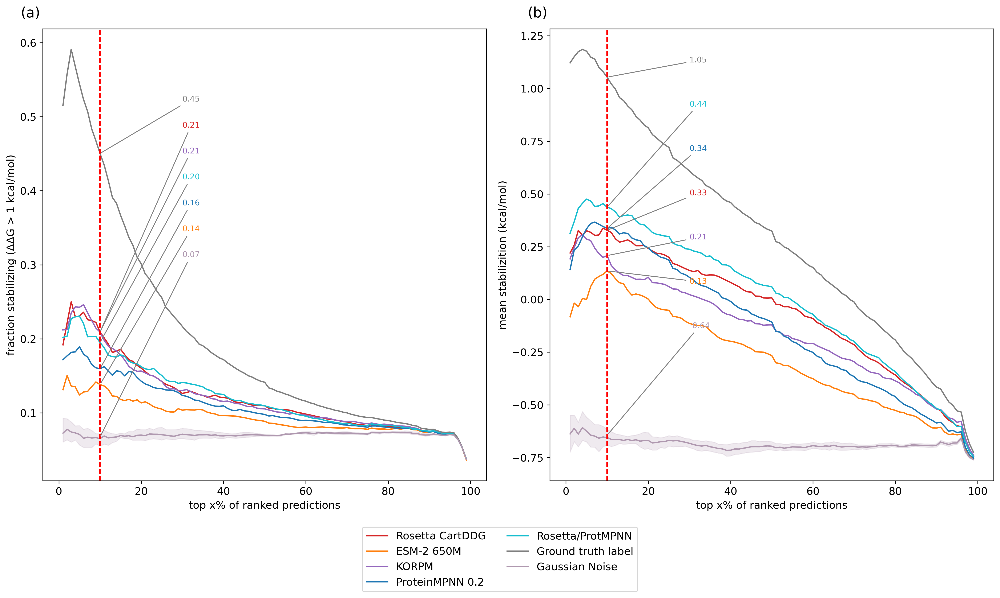

In [9]:
db_class_r = db_class.copy(deep=True)
db_class_r['random_2_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_3_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_4_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_5_dir'] = np.random.normal(loc=0, size=len(db_class_r))
class_result_new = analysis_utils.compute_stats(db_class_r, stats=('aumsc', 'auppc'), measurements=['ddG'], grouper='cluster', n_bootstraps=0)
crn = class_result_new.reset_index()
crn.loc[crn['model'].str.contains('random'), 'model'] = 'random_dir'
crn = crn.set_index(['measurement', 'model_type', 'model'])
crn
analysis_utils.recovery_curves(crn, ['mpnn_20_00_dir', 'cartesian_ddg_dir', 'mpnn_rosetta_dir', 'korpm_dir', 'esm2_650M_dir', 'ddG_dir', 'random_dir'], spacing=0.07, measurements=['ddG'], plots=['auppc', 'aumsc']) #'q3421_pslm_rfa_5_dir', 'stability-oracle_dir',

# < 4 minutes

### Recovery Curves (Visualization of Stable Mutant Enrichment, Supplementary Figure 6)

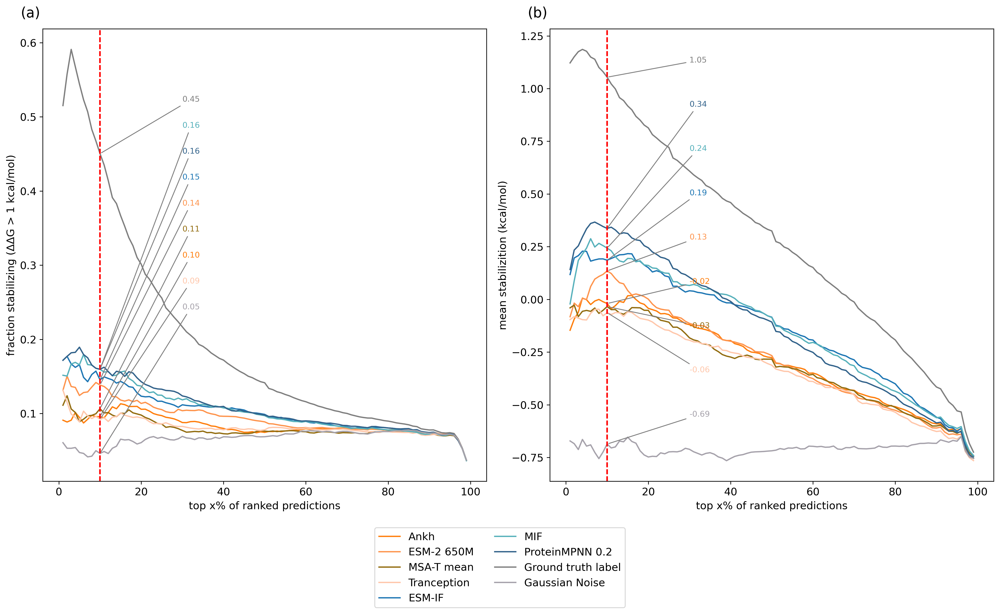

In [10]:
analysis_utils.recovery_curves(class_result_new, ['mpnn_20_00_dir', 'mif_dir', 'esmif_multimer_dir', 'ankh_dir', 'msa_transformer_mean_dir', 'esm2_650M_dir', 'tranception_dir', 'mutcomputex_dir', 'ddG_dir', 'random_dir'], spacing=0.07, measurements=['ddG'], plots=['auppc', 'aumsc'])

### Bootstrapped Q3421 Analysis (Used for Figure 1 and Extended Data Table 1)

In [11]:
summ = analysis_utils.compute_stats(db_class, 
                                    stats=('n', 'MCC', 'tp', 'fp', 'tn', 'fn', 'auprc', 'spearman', 'ndcg', 'mean_t1s', 'mean_reciprocal_rank', 'mean_stabilization', 'net_stabilization', 'sensitivity', 'recall@k0.0', 'recall@k1.0'), 
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=5, quiet=True)
tmp1 = summ.reset_index()
#tmp1.to_csv('../data/extended/q3421_extended_bootstrapped.csv')

# < 5 minutes

In [12]:
remap_names = analysis_utils.remap_names
remap_names_2 = analysis_utils.remap_names_2

remap_cols = {'auprc': 'AUPRC', 'spearman': 'Spearman\'s ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 'ndcg': 'NDCG',
    'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 'mean_stabilization': 'Mean Stabilization',
    'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy', 'mean_reciprocal_rank': 'MRR', 'n': 'n', 'MCC': 'MCC', 'recall@k1.0': 'Recall @ k'}

new_remap_cols = {}
for key, value in remap_cols.items():
    new_remap_cols[key + '_mean'] = value + ' mean'
    new_remap_cols[key + '_std'] = value + ' stdev'

s2 = tmp1.sort_values('net_stabilization_mean', ascending=False).dropna(how='all', axis=1).reset_index()
s3 = s2.loc[s2['model'].isin(original_pred_cols_reduced + [
            'random_dir', 
            'ddG_dir', 
            'q3421_pslm_rfa_2_dir', 
            'q3421_pslm_rfa_3_dir', 
            'q3421_pslm_rfa_4_dir',
            'q3421_pslm_rfa_5_dir',
            'mpnn_rosetta_dir'])
            ].drop('measurement', axis=1)

s4 = s3[['model_type', 'model', 
    'recall@k1.0_mean', 'recall@k1.0_std',
    'ndcg_mean', 'ndcg_std',
    'weighted_ndcg_mean', 'weighted_ndcg_std',
    'spearman_mean', 'spearman_std',
    'weighted_spearman_mean', 'weighted_spearman_std',
    'auprc_mean', 'auprc_std', 
    'MCC_mean', 'MCC_std', 
    'mean_stabilization_mean', 'mean_stabilization_std', 
    'net_stabilization_mean', 'net_stabilization_std',
    ]]
s4['model'] = s4['model'].map(remap_names_2)
s5 = s4.set_index(['model_type', 'model'])
s5.columns = [new_remap_cols[c] for c in s5.columns]
s5
# Iterate over the DataFrame and update the mean columns
for column in s5.columns:
    if 'mean' in column:
        stdev_column = column.replace('mean', 'stdev')
        s5[column] = s5[column].round(3).astype(str) + ' ± ' + s5[stdev_column].round(2).astype(str)

# Drop the standard deviation columns
s5 = s5[[col for col in s5.columns if 'stdev' not in col]]
s5.columns = [col[:-5] for col in s5.columns]
s6 = s5.reset_index().rename({'model_type': 'Model Type', 'model': 'Model'}, axis=1)
#s6.to_csv('../data/extended/q3421_extended_bootstrapped_formatted.csv')
s6

,Model Type,Model,Recall @ k,NDCG,wNDCG,Spearman's ρ,wρ,AUPRC,MCC,Mean Stabilization,Net Stabilization
0,unknown,ΔΔG label,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,0.563 ± 0.09,2013.888 ± 2030.31
1,biophysical,Rosetta CartDDG,0.335 ± 0.04,0.834 ± 0.03,0.748 ± 0.01,0.618 ± 0.01,0.467 ± 0.04,0.74 ± 0.04,0.37 ± 0.05,0.359 ± 0.09,722.979 ± 731.58
2,potential,KORPM,0.277 ± 0.06,0.821 ± 0.04,0.773 ± 0.02,0.541 ± 0.05,0.441 ± 0.03,0.705 ± 0.03,0.37 ± 0.05,0.228 ± 0.1,633.758 ± 708.9
3,structural,Rosetta/ProtMPNN,0.291 ± 0.06,0.856 ± 0.03,0.765 ± 0.02,0.643 ± 0.01,0.512 ± 0.03,0.783 ± 0.04,0.332 ± 0.08,0.489 ± 0.13,447.908 ± 330.57
4,structural,ProteinMPNN 0.2,0.259 ± 0.04,0.805 ± 0.05,0.736 ± 0.03,0.432 ± 0.03,0.421 ± 0.06,0.678 ± 0.04,0.267 ± 0.06,0.244 ± 0.19,270.85 ± 287.12
5,structural,ProteinMPNN 0.3,0.279 ± 0.05,0.823 ± 0.04,0.741 ± 0.02,0.435 ± 0.03,0.435 ± 0.05,0.668 ± 0.04,0.249 ± 0.06,0.24 ± 0.17,255.006 ± 253.24
6,structural,MIF,0.261 ± 0.05,0.805 ± 0.05,0.711 ± 0.01,0.444 ± 0.03,0.436 ± 0.05,0.67 ± 0.04,0.227 ± 0.06,0.272 ± 0.11,228.256 ± 175.03
7,structural,MIF-ST,0.232 ± 0.04,0.801 ± 0.06,0.73 ± 0.03,0.449 ± 0.03,0.371 ± 0.04,0.681 ± 0.05,0.224 ± 0.06,0.364 ± 0.09,226.098 ± 170.27
8,structural,ESM-IF,0.213 ± 0.03,0.796 ± 0.06,0.717 ± 0.02,0.412 ± 0.04,0.432 ± 0.05,0.657 ± 0.05,0.218 ± 0.04,0.259 ± 0.17,222.962 ± 242.03
9,structural,ESM-IF(M),0.214 ± 0.03,0.796 ± 0.06,0.721 ± 0.02,0.405 ± 0.04,0.425 ± 0.05,0.652 ± 0.05,0.21 ± 0.04,0.245 ± 0.16,210.82 ± 229.0


### Visualization of Prediction Distributions (Supplementary Figure 1)

      cluster  variable      value
23          3  ESM-2 3B  -2.967824
24          3  ESM-2 3B -11.384512
25          3  ESM-2 3B  -7.295620
26          3  ESM-2 3B  -4.958573
27          3  ESM-2 3B  -8.567253
...       ...       ...        ...
4722        8       ΔΔG  -3.610000
4723        8       ΔΔG  -1.360000
4724        8       ΔΔG   0.680000
4725        8       ΔΔG  -2.000000
4726        8       ΔΔG  -0.450000

[774 rows x 3 columns]


<Axes: xlabel='cluster', ylabel='value'>

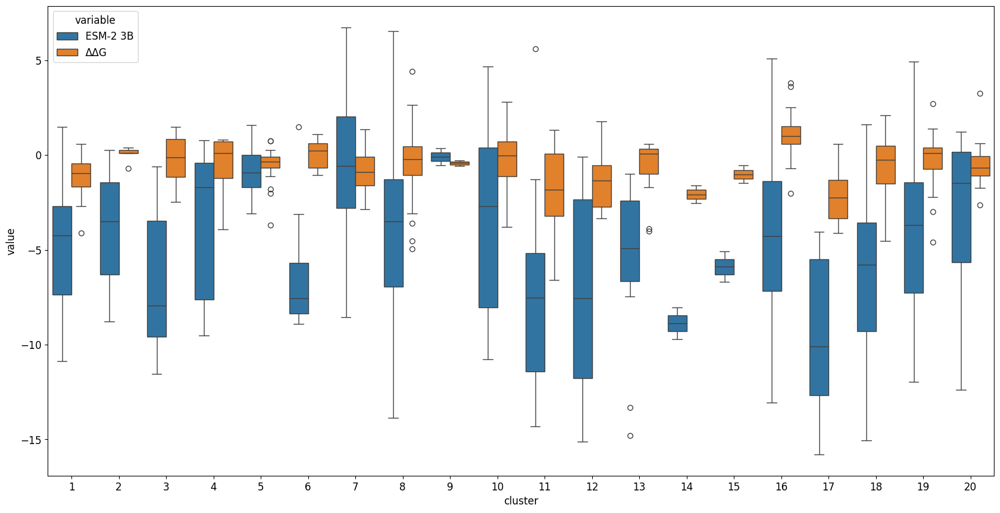

In [13]:
db_plot = db_class.copy(deep=True)
db_plot = db_plot.loc[~db_plot['ddG_dir'].isna()]
db_plot = db_plot.rename({'ddG_dir': 'ΔΔG', 'esm2_3B_dir': 'ESM-2 3B'}, axis=1)
db_plot = db_plot[['cluster', 'ESM-2 3B', 'ΔΔG']].melt(id_vars='cluster')
db_plot = db_plot.loc[db_plot['cluster']<=20]
print(db_plot)
fig, ax = plt.subplots(figsize=(20, 10))
sns.boxplot(db_plot, x='cluster', y='value', hue='variable', ax=ax)

### Supplementary Table 5

In [14]:
summ2 = analysis_utils.compute_stats(db_class, 
                                    stats=('n', 'MCC', 'tp', 'fp', 'tn', 'fn', 'auprc', 'spearman', 'accuracy', 'mse', 'net_stabilization', 'mean_stabilization', 'precision', 'recall'), 
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=5, quiet=True)
tmp2 = summ2.reset_index()

# < 1 minute

In [15]:
remap_names = analysis_utils.remap_names
remap_names_2 = analysis_utils.remap_names_2

remap_cols = {'auprc': 'AUPRC', 'spearman': 'Spearman\'s ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 'ndcg': 'NDCG',
    'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 'mean_stabilization': 'Mean Stabilization',
    'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy', 'mean_reciprocal_rank': 'MRR', 'n': 'n', 'MCC': 'MCC', 'recall@k1.0': 'Recall @ k',
    'mean_squared_error': 'MSE'}

new_remap_cols = {}
for key, value in remap_cols.items():
    new_remap_cols[key + '_mean'] = value + ' mean'
    new_remap_cols[key + '_std'] = value + ' stdev'

s2 = summ2.sort_values('mean_squared_error_mean', ascending=True).dropna(how='all', axis=1).reset_index()
s3 = s2.loc[s2['model'].isin(original_pred_cols_reduced + ['random_dir', 'ddG_dir'])].drop('measurement', axis=1)
s4 = s3[['model_type', 'model', 
    'mean_squared_error_mean', 'mean_squared_error_std',
    'accuracy_mean', 'accuracy_std',
    'spearman_mean', 'spearman_std',
    'weighted_spearman_mean', 'weighted_spearman_std',
    'net_stabilization_mean', 'net_stabilization_std',
    ]]
s4['model'] = s4['model'].map(remap_names_2)
s5 = s4.set_index(['model_type', 'model'])
s5.columns = [new_remap_cols[c] for c in s5.columns]
s5
# Iterate over the DataFrame and update the mean columns
for column in s5.columns:
    if 'mean' in column:
        stdev_column = column.replace('mean', 'stdev')
        s5[column] = s5[column].round(3).astype(str) + ' ± ' + s5[stdev_column].round(2).astype(str)

# Drop the standard deviation columns
s5 = s5[[col for col in s5.columns if 'stdev' not in col]]
s5.columns = [col[:-5] for col in s5.columns]
s6 = s5.reset_index().rename({'model_type': 'Model Type', 'model': 'Model'}, axis=1)
s6

,Model Type,Model,MSE,Accuracy,Spearman's ρ,wρ,Net Stabilization
0,unknown,ΔΔG label,0.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1262.158 ± 484.31
1,potential,KORPM,2.162 ± 0.38,0.724 ± 0.03,0.6 ± 0.04,0.423 ± 0.04,155.884 ± 163.76
2,structural,ESM-IF,4.302 ± 1.07,0.669 ± 0.05,0.455 ± 0.11,0.418 ± 0.05,197.77 ± 100.54
3,structural,ESM-IF(M),4.303 ± 1.07,0.665 ± 0.05,0.449 ± 0.11,0.411 ± 0.05,178.726 ± 95.74
4,evolutionary,Tranception,4.387 ± 1.08,0.631 ± 0.05,0.455 ± 0.05,0.238 ± 0.02,102.07 ± 38.38
5,unknown,Gaussian Noise,5.622 ± 1.17,0.481 ± 0.01,-0.031 ± 0.04,-0.016 ± 0.06,-3176.673 ± 778.08
6,structural,ProteinMPNN 0.3,6.736 ± 1.35,0.678 ± 0.05,0.518 ± 0.08,0.406 ± 0.05,182.124 ± 68.79
7,structural,ProteinMPNN 0.2,7.068 ± 1.49,0.685 ± 0.05,0.539 ± 0.08,0.402 ± 0.05,214.887 ± 81.13
8,structural,ProteinMPNN 0.1,7.622 ± 1.47,0.676 ± 0.05,0.527 ± 0.07,0.385 ± 0.04,204.736 ± 83.5
9,evolutionary,ESM-2 150M,21.426 ± 5.3,0.637 ± 0.06,0.3 ± 0.13,0.295 ± 0.03,-156.485 ± 203.4


### Figure 1

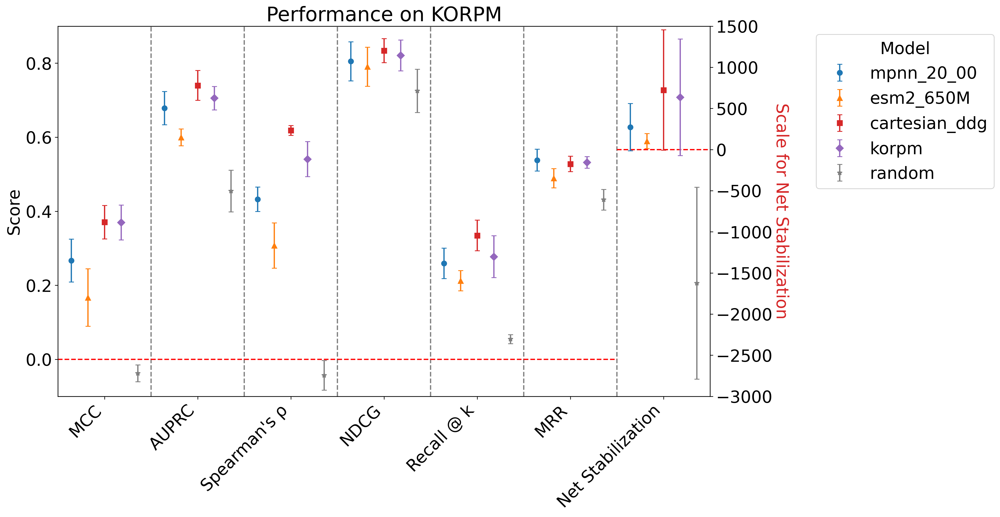

In [88]:
import importlib
importlib.reload(analysis_utils)

tmp3 = tmp1.copy(deep=True)

remap_cols = {'auprc': 'AUPRC', 'spearman': 'Spearman\'s ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 'ndcg': 'NDCG',
    'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 'mean_stabilization': 'Mean Stabilization',
    'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy', 'mean_reciprocal_rank': 'MRR', 'n': 'n', 'MCC': 'MCC', 'recall@k1.0': 'Recall @ k'}

new_remap_cols = {}
for key, value in remap_cols.items():
    new_remap_cols[key + '_mean'] = value + ' mean'
    new_remap_cols[key + '_std'] = value + ' stdev'

s2 = tmp3.sort_values('spearman_mean', ascending=False).dropna(how='all', axis=1).reset_index()
s4 = s2.loc[s2['model'].isin(original_pred_cols_reduced + ['random_dir', 'ddG_dir', 'mpnn_rosetta_dir'])]
s5 = s4

tmp2 = s5[[ 'model',  
            'MCC_mean', 'MCC_std',
            'auprc_mean', 'auprc_std',
            #'weighted_spearman_mean', 'weighted_spearman_std',
            'spearman_mean', 'spearman_std',
            #'weighted_ndcg_mean', 'weighted_ndcg_std',
            'ndcg_mean', 'ndcg_std',
            'recall@k1.0_mean', 'recall@k1.0_std',
            'mean_reciprocal_rank_mean', 'mean_reciprocal_rank_std',
            'net_stabilization_mean', 'net_stabilization_std'
            ]].set_index('model')

tmp2.columns = [new_remap_cols[c] for c in tmp2.columns]
tmp2 = tmp2.reset_index().drop_duplicates()

analysis_utils.make_scatter_chart(tmp2, models=['mpnn_20_00', 'esm2_650M',  'cartesian_ddg', 'korpm', 'random'], title='KORPM', ylim=(-0.1, 0.9), figsize=(14, 8), use_dual_y_axis=True, right_y_lim=(-3000, 1500)) #'stability-oracle', 'DDGun3D', 'MAESTRO', 

In [17]:
db_new = pd.read_csv('~/PSLMs/data/inference/tranception_results.csv', index_col=0)
db_new = db_new.rename({'tranception_weights_dir': 'tranception_new_dir', 'runtime_tranception_weights_dir': 'runtime_tranception_new_dir'}, axis=1)
db['uid3'] = db['code'] + '_' + (db['position']-db['offset_up']).astype(str) + db['mutation']
db_new = db.reset_index().set_index('uid3').join(db_new).reset_index().set_index('uid')
db_new[['tranception_new_dir']]

,tranception_new_dir
uid,
12CA_145R,NaN
1A23_30S,-0.109360
1A23_32L,-0.059789
1A23_32S,-0.032388
1A23_33S,-0.075979
...,...
5TR5_33Q,NaN
5TR5_37L,NaN
5TR5_55I,NaN


### Additional Figure describing correlation between predictions and scores of two selected models

     code  obs type tranception_dir mpnn_20_00_dir     marker
0    1A23    4  ddG            -0.8           -0.4   Bacteria
1    1A5E    3  ddG             0.5           -1.0  Eukaryota
2    1A7V   11  ddG        0.191344       0.050114   Bacteria
3    1ACB    4  ddG             0.8            0.4  Eukaryota
4    1AG2    5  ddG             0.3            0.8  Eukaryota
5    1AJ3   19  ddG         0.22105       0.428009  Eukaryota
6    1APS    6  ddG        0.260897       0.898645  Eukaryota
7    1ARR   28  ddG        0.143562       0.265206    Viruses
8    1AXB    3  ddG            -1.0           -0.5   Bacteria
9    1AYI    7  ddG        0.607143       0.071429   Bacteria
11   1BA3    4  ddG             0.8            0.4  Eukaryota
12   1BNI   95  ddG          0.5822       0.472525   Bacteria
13   1BPI   11  ddG        0.815492        0.55581  Eukaryota
14   1BTA   11  ddG        0.159819       0.041096   Bacteria
15   1BTL    5  ddG             0.9           -0.5   Bacteria
16   1BV

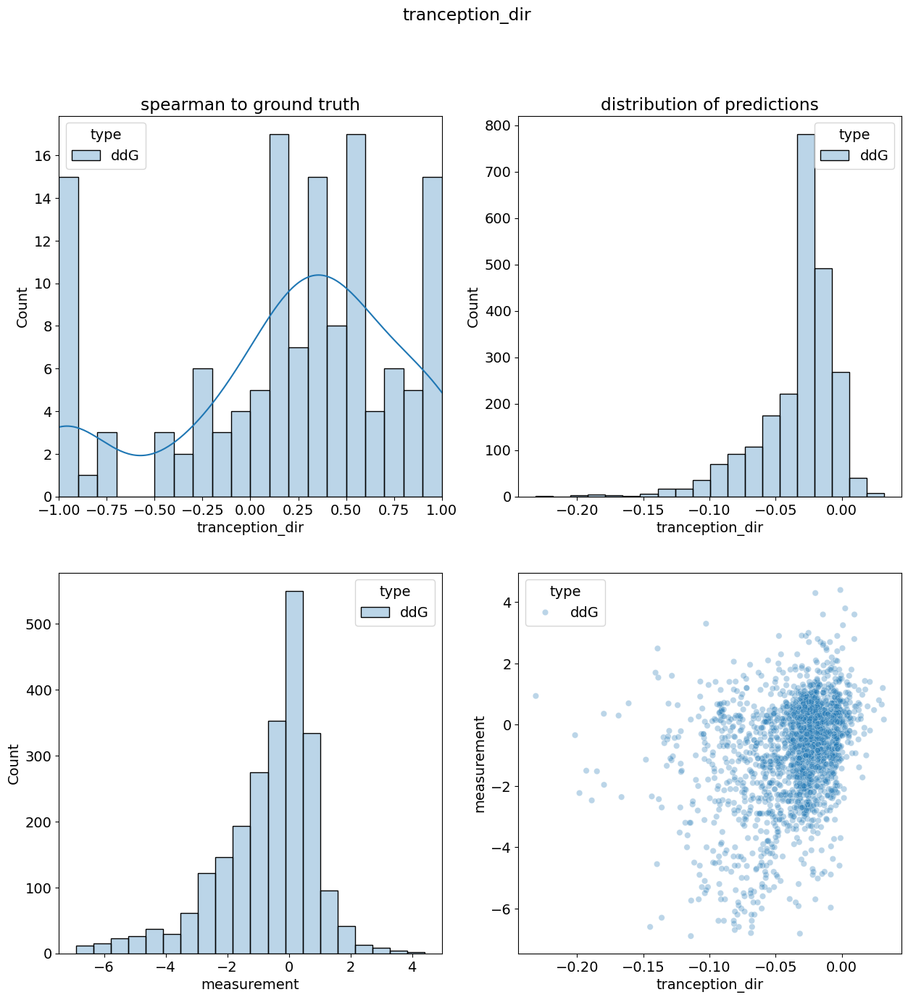

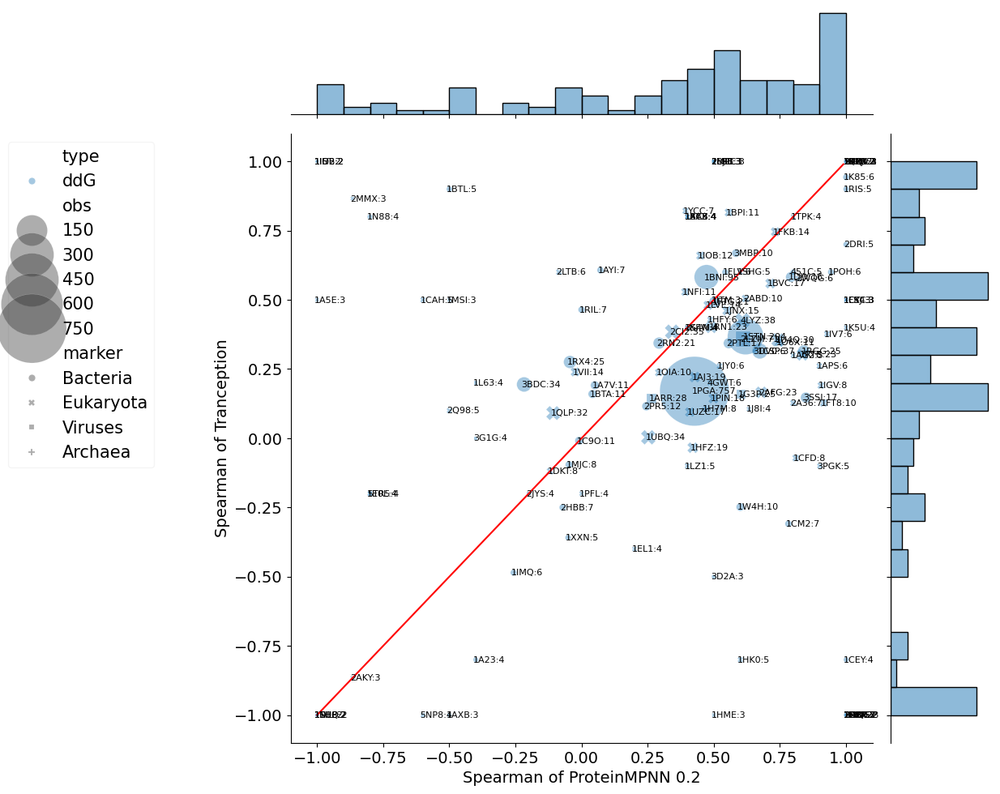

tranception_dir mpnn_20_00_dir
ddG n_total                        2339           2339
    ungrouped_spearman         0.317009        0.44787
    n_proteins                      180            180
    n_proteins_spearman             136            136
    avg_spearman               0.202313       0.354054
    weighted_spearman          0.248208       0.396635
    runtime (s)                     NaN            NaN

In [18]:
db_class_2 = db_class.copy(deep=True)
#db_class_2 = db_class_2.join(db_new[['tranception_new_dir']])
db_class_2['ddG_dir'] = db_class_2['ddG']
db_class_2['marker'] = db['origin']
db_class_2['code'] = db_class_2.reset_index('uid2').index.str[:4]
analysis_utils.correlations(db_class_2, None, stat='spearman', 
    score_name='tranception_dir', score_name_2='mpnn_20_00_dir', min_obs=1, group=True, plot=True, out=True, runtime=False)

In [19]:
db_class_2

,,mif_dir,mifst_dir,mpnn_10_00_dir,mpnn_20_00_dir,mpnn_30_00_dir,esmif_multimer_dir,esm2_3B_dir,esmif_monomer_dir,esm2_15B_half_dir,msa_1_dir,...,cartesian_ddg_dir,ddG,cluster,mpnn_rosetta_dir,random_dir,ddG_dir,korpm_pslm_rfa_5_dir,korpm_all_rfa_5_dir,marker,code
uid,uid2,,,,,,,,,,,,,,,,,,,,,
12CA_145R,12CA_140R,-7.472339,-11.654044,-0.754203,-1.014478,0.222601,0.000611,-13.121611,0.000611,-10.045898,-11.081309,...,-10.880333,-0.36,22,-11.894811,-0.850018,-0.36,-0.299253,-0.445203,Eukaryota,12CA
1A23_30S,1A23_30S,1.864485,-6.805952,1.862225,2.087240,-1.396025,-0.043713,-11.571676,-0.043713,-11.668701,-8.721450,...,-1.567467,-1.80,34,0.519773,0.784381,-1.80,-0.575849,-0.043803,Bacteria,1A23
1A23_32L,1A23_32L,1.119251,-7.800102,-0.200148,2.129448,-0.085721,-0.042389,-13.755667,-0.042389,-13.076172,-7.793007,...,1.773667,-4.60,34,3.903115,-0.046428,-4.60,0.419953,0.427284,Bacteria,1A23
1A23_32S,1A23_32S,-0.854073,-5.414868,0.188699,0.849972,0.863521,-0.029983,-8.291791,-0.029983,-10.436035,-5.083358,...,-2.198333,-5.20,34,-1.348361,-0.340739,-5.20,-0.404675,-0.020241,Bacteria,1A23
1A23_33S,1A23_33S,0.348253,-5.093968,0.965242,-0.514806,0.980866,-0.024960,-12.002896,-0.024961,-12.722168,-7.606897,...,0.794333,-1.10,34,0.279527,0.771216,-1.10,-0.839556,-0.260902,Bacteria,1A23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5TR5_33Q,5TR5_33Q,-0.197353,-0.914865,-0.652905,-0.046959,0.548482,-0.000270,-1.666809,-0.000271,-1.537109,-3.267214,...,1.595667,-0.65,47,1.548708,-1.790528,-0.65,0.128101,0.300868,Eukaryota,5TR5
5TR5_37L,5TR5_37L,-7.014242,-4.624759,-2.038346,-2.644756,-1.633662,-0.141230,-3.879099,-0.141230,-4.250977,-7.255979,...,0.726333,-0.29,47,-1.918423,0.406474,-0.29,0.297722,-0.387203,Eukaryota,5TR5
5TR5_55I,5TR5_55I,-3.645788,-3.215672,-3.165476,-3.178130,-2.039948,-0.014492,-0.803307,-0.014492,-1.160156,-6.826414,...,-0.450000,0.24,47,-3.628130,0.860098,0.24,0.284853,-0.072323,Eukaryota,5TR5


### Figure 4 a&b

  0%|          | 0/5 [00:00<?, ?it/s]

['ddG_dir', 'korpm_pslm_rfa_5_dir', 'cartesian_ddg_dir', 'korpm_dir', 'mpnn_20_00_dir', 'mif_dir', 'esmif_multimer_dir', 'mifst_dir', 'esm2_650M_dir', 'esm2_15B_half_dir', 'msa_transformer_mean_dir', 'ankh_dir', 'tranception_dir', 'random_dir']
class
0 >= ΔΔG > -1.5    534
ΔΔG <= -1.5        378
ΔΔG > 0            699
Name: n, dtype: int64


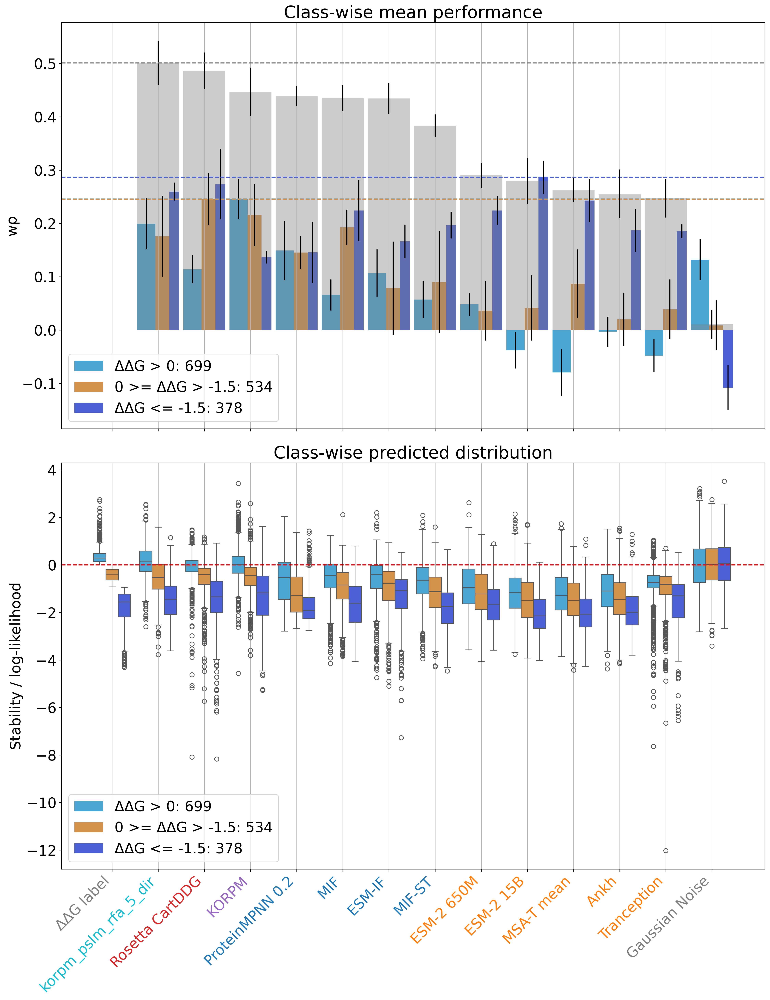

In [20]:
subset = ['korpm_pslm_rfa_5_dir',
            #'mpnn_rosetta_dir',
            'cartesian_ddg_dir',
            'korpm_dir',
            'msa_transformer_mean_dir',
            'tranception_dir',
            'esm2_650M_dir',
            'esm2_15B_half_dir',
            'ankh_dir',
            'esmif_multimer_dir',
            #'mpnn_10_00_dir',
            'mpnn_20_00_dir',
            #'mpnn_30_00_dir',
            'mif_dir',
            'mifst_dir',
            #'mutcomputex_dir',
            #'stability-oracle_dir',
            'random_dir',
            'ddG_dir']

db_complete = db_class.join(db[[c for c in db.columns if not c in db_class.columns]], how='left')
db_complete['ddG_dir'] = db_complete['ddG']
db_complete['ΔΔG'] = db_complete['ddG']
#db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]

current_feats = ['ΔΔG', 'ddG']
# fillna only applies to a handful of predictions from Stability Oracle
db_fig = db_complete[[c for c in db_complete if '_dir' in c or c in current_feats or c == 'cluster']].fillna(0)
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'ΔΔG', 
                        split_col_2 = None, 
                        threshold_1 = 0, 
                        threshold_2 = -1.5, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps= 5,
                        count_muts = True,
                        subset = subset,
                        grouper = 'cluster'
                        )  
# < 10 seconds

### Figure 4 c&d

  0%|          | 0/5 [00:00<?, ?it/s]

conservation > 80% : 615
conservation <= 80% : 872
['ddG_dir', 'korpm_pslm_rfa_5_dir', 'cartesian_ddg_dir', 'korpm_dir', 'mpnn_20_00_dir', 'mif_dir', 'mifst_dir', 'esmif_multimer_dir', 'ankh_dir', 'esm2_15B_half_dir', 'tranception_dir', 'esm2_650M_dir', 'msa_transformer_mean_dir', 'random_dir']
class
conservation <= 80    872
conservation > 80     615
Name: n, dtype: int64


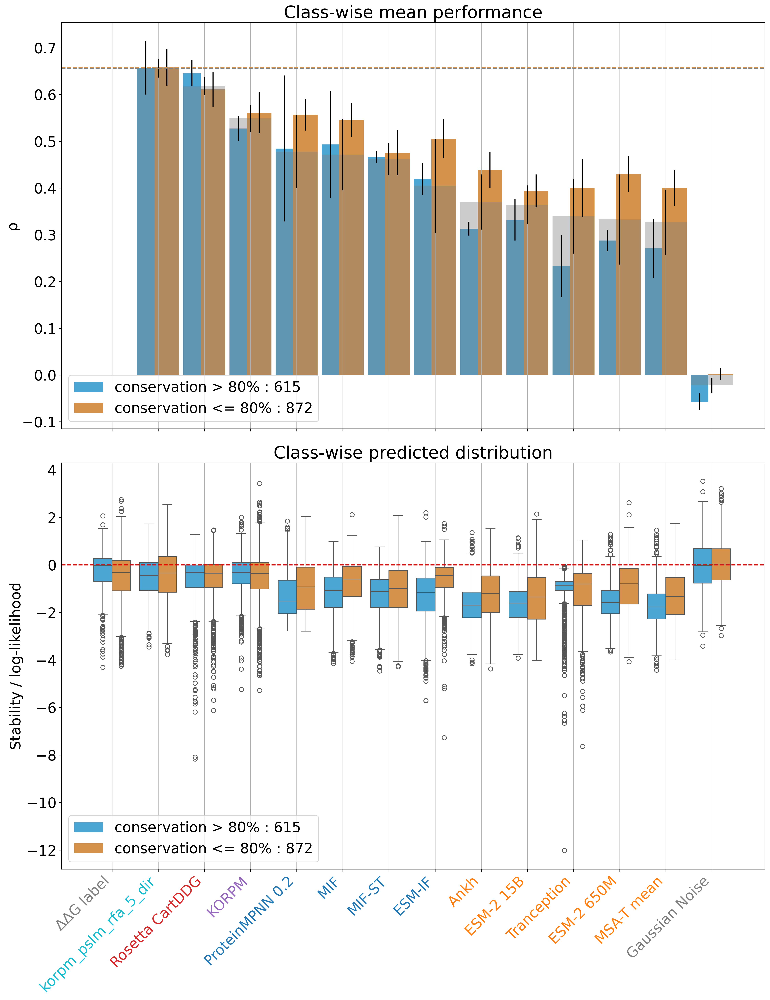

In [21]:
importlib.reload(analysis_utils)
current_feats = ['conservation', 'ddG']
db_fig = db_complete[[c for c in db_complete if '_dir' in c or c in current_feats or c == 'cluster']]
db_fig = db_fig.fillna(0)
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'conservation', 
                        split_col_2 = None, 
                        threshold_1 = 80, 
                        threshold_2 = None, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        #statistic_2 = 'weighted_spearman',
                        n_bootstraps= 5,
                        count_muts = True,
                        subset=subset,
                        grouper='cluster'
                        )
# < 10 seconds

### Extended Data Figure 3

  0%|          | 0/10 [00:00<?, ?it/s]

['ddG_dir', 'korpm_pslm_rfa_5_dir', 'cartesian_ddg_dir', 'korpm_dir', 'mpnn_10_00_dir', 'mpnn_30_00_dir', 'mif_dir', 'mifst_dir', 'esmif_multimer_dir', 'ankh_dir', 'esm2_15B_half_dir', 'esm2_650M_dir', 'msa_transformer_mean_dir', 'tranception_dir', 'random_dir']
class
1 >= delta_vol > -1    363
delta_vol <= -1        536
delta_vol > 1          474
Name: n, dtype: int64


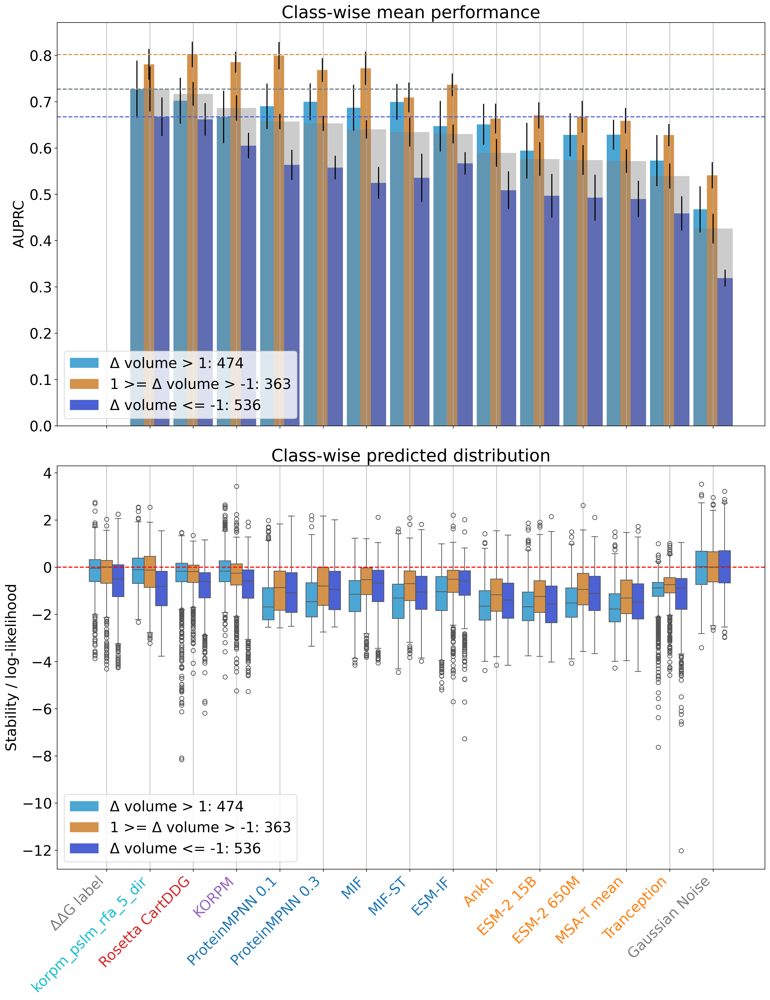

In [22]:
subset = ['korpm_pslm_rfa_5_dir',
            #'mpnn_rosetta_dir',
            'cartesian_ddg_dir',
            'korpm_dir',
            'msa_transformer_mean_dir',
            'tranception_dir',
            'esm2_650M_dir',
            'esm2_15B_half_dir',
            'ankh_dir',
            'esmif_multimer_dir',
            'mpnn_10_00_dir',
            #'mpnn_20_00_dir',
            'mpnn_30_00_dir',
            'mif_dir',
            'mifst_dir',
            #'mutcomputex_dir',
            #'stability-oracle_dir',
            'random_dir',
            'ddG_dir']

# Figure 1 c + d

db_fig = db_complete[[c for c in db_complete if '_dir' in c or c in current_feats or c == 'cluster']]
db_fig = db_fig.rename({'delta_vol_dir': 'delta_vol'}, axis=1)
db_fig = db_fig.fillna(0)
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'delta_vol', 
                        split_col_2 = None, 
                        threshold_1 = 1, 
                        threshold_2 = -1, 
                        measurement = 'ddG',
                        statistic = 'auprc',
                        #statistic_2 = 'weighted_spearman',
                        n_bootstraps=10,
                        count_muts = True,
                        subset=subset,
                        grouper='cluster'
                        )
# < 10 seconds

### Extended Data Figure 4

  0%|          | 0/5 [00:00<?, ?it/s]

['ddG_dir', 'korpm_pslm_rfa_5_dir', 'cartesian_ddg_dir', 'korpm_dir', 'mpnn_10_00_dir', 'mpnn_30_00_dir', 'esmif_multimer_dir', 'mif_dir', 'mifst_dir', 'ankh_dir', 'esm2_650M_dir', 'msa_transformer_mean_dir', 'esm2_15B_half_dir', 'tranception_dir', 'random_dir']
class
delta_kdh <= 0 & rel_ASA <= 0.2    265
delta_kdh <= 0 & rel_ASA > 0.2     310
delta_kdh > 0 & rel_ASA <= 0.2     196
delta_kdh > 0 & rel_ASA > 0.2      459
Name: n, dtype: int64


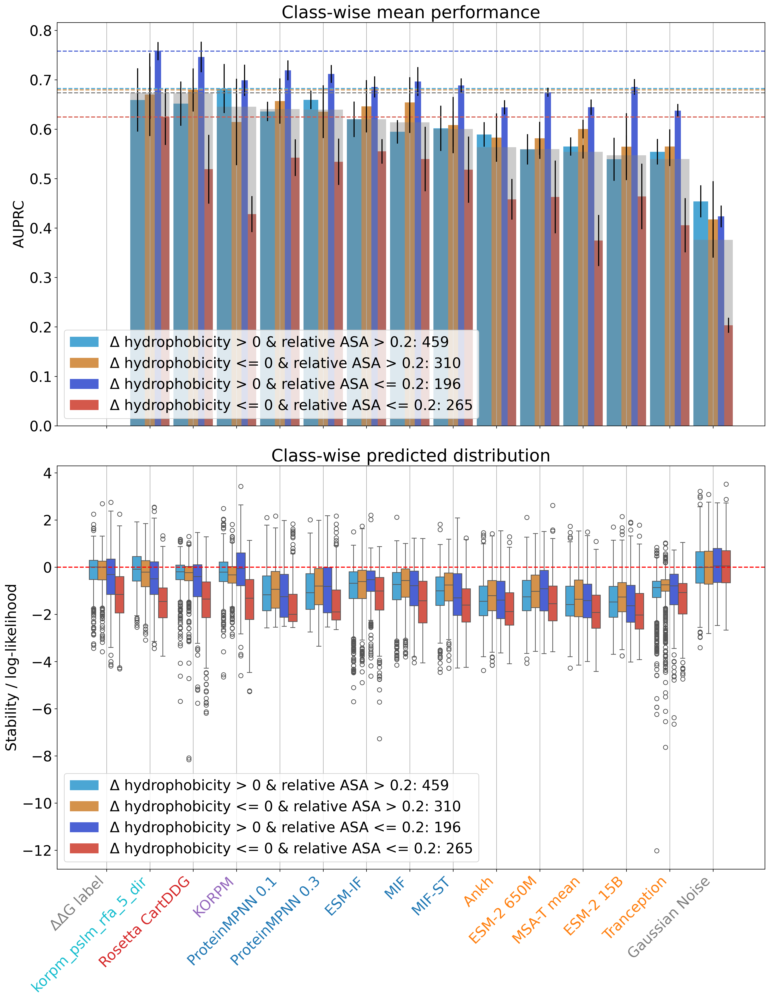

In [23]:
current_feats = ['delta_kdh', 'rel_ASA', 'ddG']
db_fig = db_complete[[c for c in db_complete if '_dir' in c or c in current_feats or c == 'cluster']]
l1 = len(db_fig)
db_fig = db_fig.fillna(0)
#db_fig = db_fig.drop(['delta_kdh_dir', 'rel_ASA_dir'], axis=1)
db_fig = db_fig.rename({'delta_kdh_dir': 'delta_kdh', 'rel_ASA_dir': 'rel_ASA'}, axis=1)
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'delta_kdh', 
                        split_col_2 = 'rel_ASA', 
                        threshold_1 = 0, 
                        threshold_2 = 0.2, 
                        measurement = 'ddG',
                        statistic = 'auprc',
                        #statistic_2 = 'weighted_spearman',
                        n_bootstraps=5,
                        count_muts = True,
                        subset=subset,
                        grouper='cluster'
                        )
# < 10 seconds

### Generating the pairwise ensembles used in the model complementarity section

In [24]:
zs_feats = ['rel_ASA', 'delta_kdh', 'delta_vol', 'delta_chg']
models = original_pred_cols_reduced + [c + '_dir' for c in zs_feats]

dfm = db[models + ['cluster', 'ddG']] #db_summ.join(db_feats_2[zs_feats].drop_duplicates(), how='left')
#dfm['code'] = dfm.reset_index('uid2').index.str[:4]
ren = dict(zip(zs_feats, [f+'_dir' for f in zs_feats]))
dfm = dfm.rename(ren, axis=1)
dfr = db_runtimes.copy(deep=True).reset_index(level=0, drop=True)#.drop('uid', axis=1)
dfr['code'] = dfr.index.str[:4]
dfr[['runtime_' + r for r in ['rel_ASA_dir', 'delta_kdh_dir', 'delta_vol_dir', 'delta_chg_dir']]] = 0

weights = [1, 0.5, 0.2] #, -0.2] # could include -0.2 to allow for subtracting models
weights2 = [] # fill in weights to test 3-model ensembles
#weights2 = [0.8, 0.3]

all_cols = []

tmp_preds = []
tmp_runtimes = []
for model1 in models:
    for model2 in models:
        if model1 != model2:
            for weight in weights:
                tmp_preds.append(pd.Series(dfm[model1]/dfm[model1].std() + dfm[model2]/dfm[model2].std() * weight, name=f'{model1} + {model2} * {weight}'))
                #tmp_preds.append(pd.Series((dfm[model1]-dfm[model1].min())/dfm[model1].max() + (dfm[model2]-dfm[model2].min())/dfm[model1].max() * weight, name=f'{model1} + {model2} * {weight}'))
                all_cols.append(f'{model1} + {model2} * {weight}')
                tmp_runtimes.append(pd.Series(dfr['runtime_'+model1] + dfr['runtime_'+model2], name=f'runtime_'+all_cols[-1]))
                for model3 in models:
                    if model3 != model2:
                    #if (model1.split('_')[0] != model3.split('_')[0]) and (model2.split('_')[0] != model3.split('_')[0]):
                        for weight2 in weights2:
                            tmp_preds.append(pd.Series(dfm[model1]/dfm[model1].std() + dfm[model2]/dfm[model2].std() * weight + dfm[model3]/dfm[model3].std() * weight2, name=f'{model1} + {model2} * {weight} + {model3} * {weight2}'))
                            #tmp_preds.append(pd.Series((dfm[model1]-dfm[model1].min())/dfm[model1].max() + (dfm[model2]-dfm[model2].min())/dfm[model2].max() * weight + (dfm[model3]-dfm[model3].min())/dfm[model3].max() * weight2, name=f'{model1} + {model2} * {weight} + {model3} * {weight2}'))
                            all_cols.append(f'{model1} + {model2} * {weight} + {model3} * {weight2}')
                            #tmp_runtimes.append(pd.Series(dfr['runtime_'+model1] + dfr['runtime_'+model2] + dfr['runtime_'+model3], name='runtime_'+all_cols[-1]))

print('concatenating')
dfm = pd.concat([dfm] + tmp_preds, axis=1)
dfr = pd.concat([dfr] + tmp_runtimes, axis=1)
print('joining...')
dfm = dfm.join(dfr.drop('code', axis=1))
dfm

# < 10 seconds

concatenating
joining...


,,mif_dir,mifst_dir,mpnn_10_00_dir,mpnn_20_00_dir,mpnn_30_00_dir,esmif_multimer_dir,esm2_3B_dir,esmif_monomer_dir,esm2_15B_half_dir,msa_transformer_median_dir,...,runtime_delta_chg_dir + cartesian_ddg_dir * 0.2,runtime_delta_chg_dir + rel_ASA_dir * 1,runtime_delta_chg_dir + rel_ASA_dir * 0.5,runtime_delta_chg_dir + rel_ASA_dir * 0.2,runtime_delta_chg_dir + delta_kdh_dir * 1,runtime_delta_chg_dir + delta_kdh_dir * 0.5,runtime_delta_chg_dir + delta_kdh_dir * 0.2,runtime_delta_chg_dir + delta_vol_dir * 1,runtime_delta_chg_dir + delta_vol_dir * 0.5,runtime_delta_chg_dir + delta_vol_dir * 0.2
uid,uid2,,,,,,,,,,,,,,,,,,,,,
12CA_145R,12CA_140R,-7.472339,-11.654044,-0.754203,-1.014478,0.222601,0.000611,-13.121611,0.000611,-10.045898,-10.325167,...,6,0,0,0,0,0,0,0,0,0
1A23_30S,1A23_30S,1.864485,-6.805952,1.862225,2.087240,-1.396025,-0.043713,-11.571676,-0.043713,-11.668701,-9.082487,...,5,0,0,0,0,0,0,0,0,0
1A23_32L,1A23_32L,1.119251,-7.800102,-0.200148,2.129448,-0.085721,-0.042389,-13.755667,-0.042389,-13.076172,-7.793007,...,6,0,0,0,0,0,0,0,0,0
1A23_32S,1A23_32S,-0.854073,-5.414868,0.188699,0.849972,0.863521,-0.029983,-8.291791,-0.029983,-10.436035,-5.083358,...,6,0,0,0,0,0,0,0,0,0
1A23_33S,1A23_33S,0.348253,-5.093968,0.965242,-0.514806,0.980866,-0.024960,-12.002896,-0.024961,-12.722168,-7.606897,...,6,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5TR5_33Q,5TR5_33Q,-0.197353,-0.914865,-0.652905,-0.046959,0.548482,-0.000270,-1.666809,-0.000271,-1.537109,-3.267214,...,6,0,0,0,0,0,0,0,0,0
5TR5_37L,5TR5_37L,-7.014242,-4.624759,-2.038346,-2.644756,-1.633662,-0.141230,-3.879099,-0.141230,-4.250977,-7.255979,...,5,0,0,0,0,0,0,0,0,0
5TR5_55I,5TR5_55I,-3.645788,-3.215672,-3.165476,-3.178130,-2.039948,-0.014492,-0.803307,-0.014492,-1.160156,-6.826414,...,6,0,0,0,0,0,0,0,0,0


### Function to retrieve all the pairwise predictions (precalculated for this demo)

In [25]:
def get_summary_df(db_complete, cols=None, class_stats=(), saveloc='../data/pairwise/q3421_pairwise.csv', overwrite=False):

    if not overwrite:
        assert not os.path.exists(saveloc)
    if cols is None:
        cols = db_complete.columns

    df_summ = analysis_utils.compute_stats(db_complete[cols], stats=class_stats, measurements=['ddG'], grouper='cluster').reset_index().set_index(['measurement', 'model'])
    df_summ = df_summ.reset_index().rename({'index': 'model'}, axis=1)
    df_summ = df_summ.set_index(['measurement', 'model_type', 'model', 'class'])

    df_summ.to_csv(saveloc)
    return df_summ

d1 = get_summary_df(dfm, saveloc=os.path.join(path, 'data', 'pairwise', 'pairwise_q3421_combinations_3_weights_x3.csv'), overwrite=True)

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/1541 [00:00<?, ?it/s]

KeyboardInterrupt: 

### Pairwise statistics for all model combinations

In [ ]:
# compute all statistics on the combined set (already done, takes ~12 hours)
d1 = pd.read_csv(os.path.join(path, 'data', 'pairwise', 'pairwise_q3421_combinations_3_weights_x3.csv')).set_index(['measurement', 'model_type', 'model', 'class'])
d1.xs('ddG').sort_values('aumsc', ascending=False).iloc[:20, 13:]

auroc  \
model_type  model                                        class             
biophysical cartesian_ddg_dir + mpnn_10_00_dir * 0.5     NaN    0.814091   
            cartesian_ddg_dir + mpnn_20_00_dir * 0.5     NaN    0.815042   
            cartesian_ddg_dir + mpnn_30_00_dir * 0.5     NaN    0.812216   
            cartesian_ddg_dir + mif_dir * 0.5            NaN    0.805764   
            cartesian_ddg_dir + esmif_multimer_dir * 0.5 NaN    0.796940   
            cartesian_ddg_dir + esmif_monomer_dir * 0.5  NaN    0.795167   
            cartesian_ddg_dir + mpnn_10_00_dir * 0.2     NaN    0.819812   
            cartesian_ddg_dir + mpnn_20_00_dir * 0.2     NaN    0.820145   
            cartesian_ddg_dir + mpnn_30_00_dir * 0.2     NaN    0.818961   
            cartesian_ddg_dir + mifst_dir * 0.5          NaN    0.813378   
            mpnn_20_00_dir + cartesian_ddg_dir * 1       NaN    0.796698   
            cartesian_ddg_dir + mpnn_20_00_dir * 1       NaN    0.796698   
            cartesian_ddg_dir + esmif_multimer_dir * 1   NaN    0.772960   
            esmif_multimer_dir + cartesian_ddg_dir * 1   NaN    0.772960   
            cartesian_ddg_dir + mpnn_30_00_dir * 1       NaN    0.792962   
            mpnn_30_00_dir + cartesian_ddg_dir * 1       NaN    0.792962   
            esmif_monomer_dir + cartesian_ddg_dir * 1    NaN    0.770349   
            cartesian_ddg_dir + esmif_monomer_dir * 1    NaN    0.770349   
            cartesian_ddg_dir + esmif_multimer_dir * 0.2 NaN    0.807976   
            cartesian_ddg_dir + mif_dir * 1              NaN    0.787762   

                                                                   auprc  \
model_type  model                                        class             
biophysical cartesian_ddg_dir + mpnn_10_00_dir * 0.5     NaN    0.743226   
            cartesian_ddg_dir + mpnn_20_00_dir * 0.5     NaN    0.745775   
            cartesian_ddg_dir + mpnn_30_00_dir * 0.5     NaN    0.737354   
            cartesian_ddg_dir + mif_dir * 0.5            NaN    0.732064   
            cartesian_ddg_dir + esmif_multimer_dir * 0.5 NaN    0.722145   
            cartesian_ddg_dir + esmif_monomer_dir * 0.5  NaN    0.719905   
            cartesian_ddg_dir + mpnn_10_00_dir * 0.2     NaN    0.741132   
            cartesian_ddg_dir + mpnn_20_00_dir * 0.2     NaN    0.741751   
            cartesian_ddg_dir + mpnn_30_00_dir * 0.2     NaN    0.737198   
            cartesian_ddg_dir + mifst_dir * 0.5          NaN    0.740761   
            mpnn_20_00_dir + cartesian_ddg_dir * 1       NaN    0.726819   
            cartesian_ddg_dir + mpnn_20_00_dir * 1       NaN    0.726819   
            cartesian_ddg_dir + esmif_multimer_dir * 1   NaN    0.706452   
            esmif_multimer_dir + cartesian_ddg_dir * 1   NaN    0.706452   
            cartesian_ddg_dir + mpnn_30_00_dir * 1       NaN    0.716894   
            mpnn_30_00_dir + cartesian_ddg_dir * 1       NaN    0.716894   
            esmif_monomer_dir + cartesian_ddg_dir * 1    NaN    0.703431   
            cartesian_ddg_dir + esmif_monomer_dir * 1    NaN    0.703431   
            cartesian_ddg_dir + esmif_multimer_dir * 0.2 NaN    0.723718   
            cartesian_ddg_dir + mif_dir * 1              NaN    0.712881   

                                                                0.0_n_stable  \
model_type  model                                        class                 
biophysical cartesian_ddg_dir + mpnn_10_00_dir * 0.5     NaN           991.0   
            cartesian_ddg_dir + mpnn_20_00_dir * 0.5     NaN           991.0   
            cartesian_ddg_dir + mpnn_30_00_dir * 0.5     NaN           991.0   
            cartesian_ddg_dir + mif_dir * 0.5            NaN           991.0   
            cartesian_ddg_dir + esmif_multimer_dir * 0.5 NaN           991.0   
            cartesian_ddg_dir + esmif_monomer_dir * 0.5  NaN           991.0   
            cartesian_ddg_dir + mpnn_10_00_dir * 0.2     NaN           991.0   
 

### Supplementary Figure 7

2369


  0%|          | 0/10 [00:00<?, ?it/s]

0.06736416323394556
['Rosetta CartDDG', 'KORPM', 'MIF', 'ProteinMPNN 0.2', 'MIF-ST', 'ESM-IF', 'Ankh', 'Tranception', 'ESM-2 650M', 'MSA-T mean', 'ESM-1V mean']


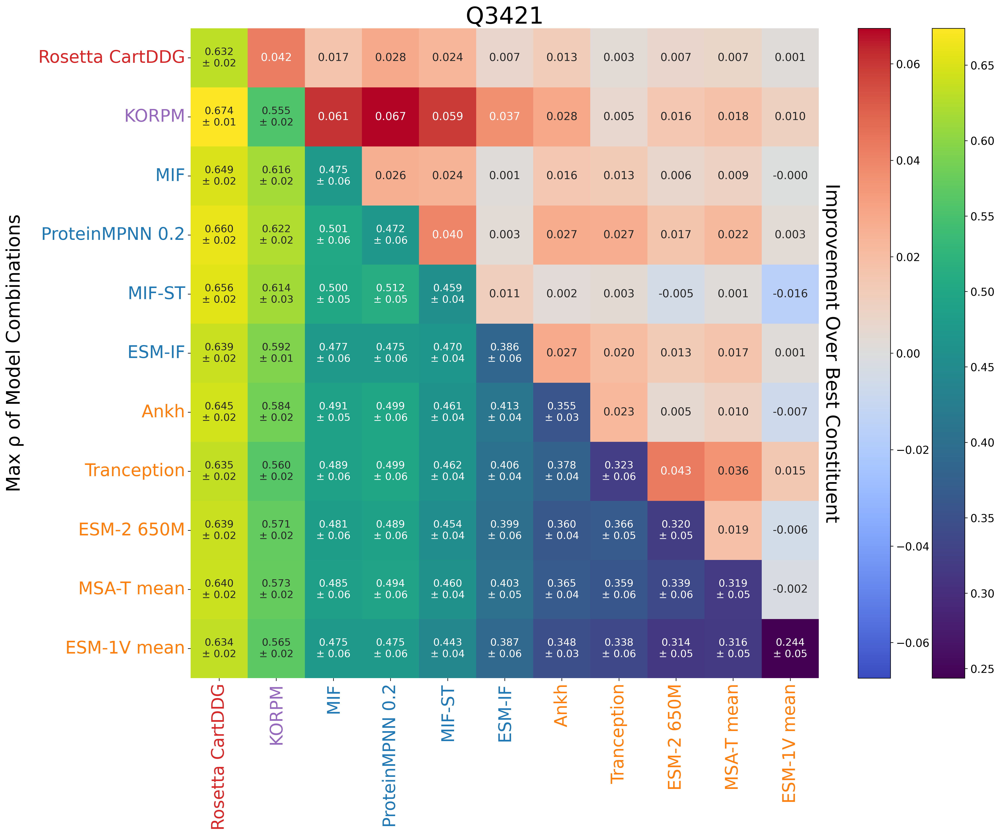

,model1,weight1,model2,weight2,mean_spearman,p_value
rank,,,,,,
1,cartesian_ddg_dir,1,korpm_dir,0.5,0.674427,0.0
2,cartesian_ddg_dir,1,korpm_dir,1,0.667476,0.000006
3,cartesian_ddg_dir,1,korpm_dir,0.2,0.662031,0.0
4,cartesian_ddg_dir,1,mpnn_20_00_dir,0.2,0.660258,0.000008
5,cartesian_ddg_dir,1,mifst_dir,0.2,0.655891,0.0


In [ ]:
subset2 = [
            'cartesian_ddg_dir',
            'esm1v_mean_dir',
            'msa_transformer_mean_dir',
            'tranception_dir',
            'ankh_dir',
            'esm2_650M_dir',
            'esmif_multimer_dir',
            'mpnn_20_00_dir',
            'mif_dir',
            'mifst_dir',
            'korpm_dir',
            'mutcomputex_dir',
            'stability-oracle_dir'
        ]

measurement = 'ddG'
statistic = 'spearman'
upper = 'delta'

d3 = d1.copy(deep=True)
d3 = d3.reset_index()
d3 = d3.set_index(['measurement', 'model_type', 'model', 'class'])
d3 = d3.drop([c for c in d3.columns if 'pos_' in c], axis=1)

stat_df, delta_df = analysis_utils.model_combinations_heatmap(d3, dfm.fillna(0), db[['ddG']], statistic, measurement, n_bootstraps=10, upper=upper, subset=subset2, title='Q3421')
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}'])
stat_df['standardized_pair'] = stat_df.apply(lambda x: '_'.join(sorted([x['model1'] + str(x['weight1']), x['model2'] + str(x['weight2'])])), axis=1)
stat_df = stat_df.drop_duplicates(subset='standardized_pair')
stat_df = stat_df.drop(columns='standardized_pair').reset_index(drop=True).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1
stat_df = stat_df.set_index('rank')
stat_df.head()

### Extra Figure (not in text) showing Net Stabilization instead

2369


  0%|          | 0/10 [00:00<?, ?it/s]

72.57079999999999
['Rosetta CartDDG', 'ProteinMPNN 0.2', 'MIF-ST', 'KORPM', 'MIF', 'ESM-IF', 'ESM-2 650M', 'Ankh', 'Tranception', 'MSA-T mean', 'ESM-1V mean']


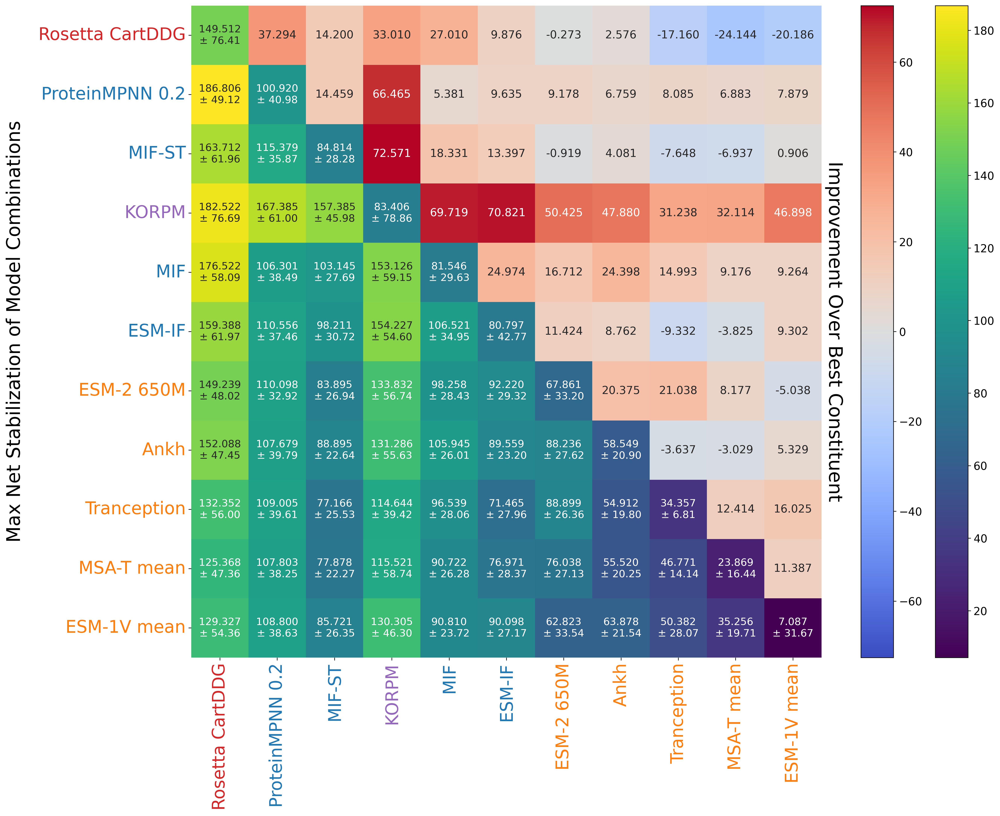

,model1,weight1,model2,weight2,mean_net_stabilization,p_value
rank,,,,,,
1,cartesian_ddg_dir,1,mpnn_20_00_dir,0.2,186.8058,0.023437
2,cartesian_ddg_dir,1,korpm_dir,0.2,182.522,0.000006
3,cartesian_ddg_dir,1,korpm_dir,0.5,181.787,0.000003
4,cartesian_ddg_dir,1,mif_dir,0.2,176.5218,0.035495
5,cartesian_ddg_dir,1,mif_dir,0.5,170.315,0.215458


In [ ]:
measurement = 'ddG'
statistic = 'net_stabilization'
upper = 'delta'

d3 = d1.copy(deep=True)
d3 = d3.reset_index()
d3 = d3.set_index(['measurement', 'model_type', 'model', 'class'])
d3 = d3.drop([c for c in d3.columns if 'pos_' in c], axis=1)

stat_df, delta_df = analysis_utils.model_combinations_heatmap(d3, dfm.fillna(0), db[['ddG']], statistic, measurement, n_bootstraps=10, upper=upper, subset=subset2)
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}'])
stat_df['standardized_pair'] = stat_df.apply(lambda x: '_'.join(sorted([x['model1'] + str(x['weight1']), x['model2'] + str(x['weight2'])])), axis=1)
stat_df = stat_df.drop_duplicates(subset='standardized_pair')
stat_df = stat_df.drop(columns='standardized_pair').reset_index(drop=True).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1
stat_df = stat_df.set_index('rank')
#stat_df.loc[stat_df['runtime_gpu']<0, 'runtime_gpu'] = np.nan
stat_df.head()

# ~ 10 seconds

### Supplementary Figure 8

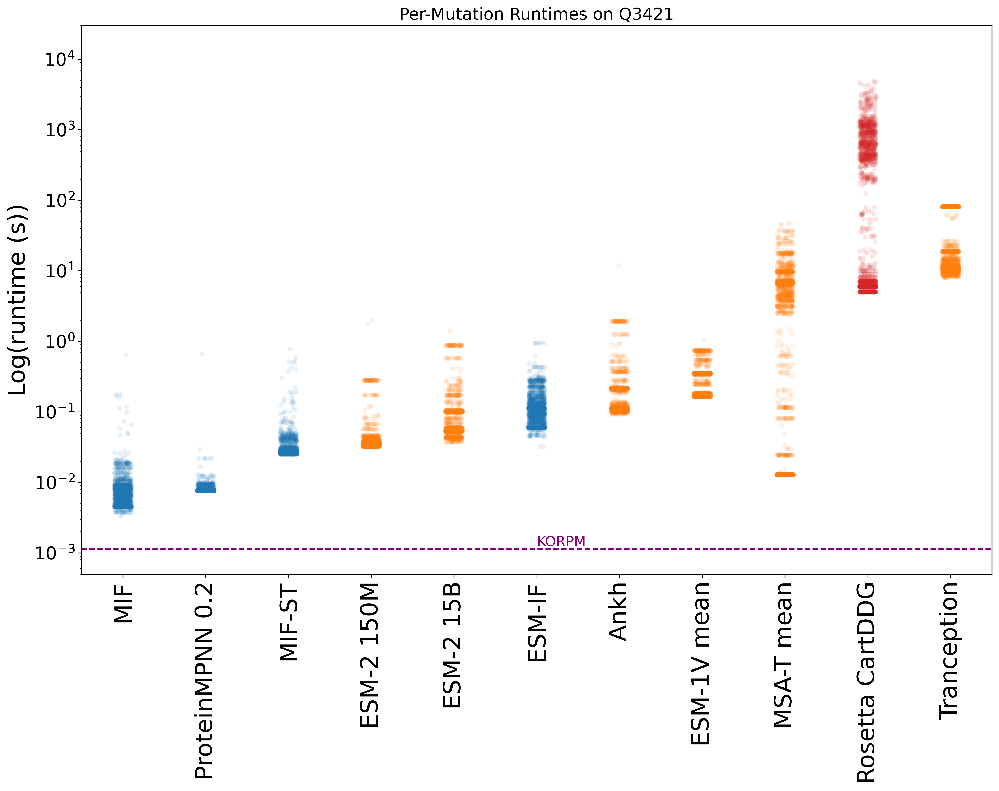

In [ ]:
int_runtimes = db_runtimes.dropna(axis=1, how='all')#.groupby('code').mean()#.sum() #uncomment to get mean per protein
int_runtimes = int_runtimes[[
                             'runtime_esmif_multimer_dir',
                             'runtime_mif_dir',
                             'runtime_mifst_dir',
                             'runtime_mpnn_20_00_dir',
                             'runtime_tranception_dir',
                             'runtime_msa_transformer_mean_dir',
                             'runtime_esm1v_mean_dir',
                             'runtime_esm2_150M_dir',
                             'runtime_cartesian_ddg_dir',
                             'runtime_ankh_dir',
                             'runtime_esm2_15B_half_dir',
                             'runtime_korpm_dir'
                            ]]

int_runtimes.columns = [c[8:-4] for c in int_runtimes.columns]
#int_runtimes.columns = int_runtimes.columns.map(analysis_utils.remap_names)
total_runtimes = int_runtimes.melt().sort_values('value')#.sum(axis=0)

### determine order for displaying runtimes
# Calculate the grouped median
grouped_median = total_runtimes.groupby('variable')['value'].median()
# Create a temporary column 'group_median' with the grouped medians mapped to each row
total_runtimes['group_median'] = total_runtimes['variable'].map(grouped_median)
# Sort the DataFrame first by 'group_median' and then by 'variable'
df_sorted = total_runtimes.sort_values(['group_median', 'variable'], ascending=True)
# Drop the temporary column 'group_median'
total_runtimes = df_sorted.drop(columns=['group_median'])
korpm_time = total_runtimes.loc[total_runtimes['variable']=='korpm', 'value'].mean()
total_runtimes = total_runtimes.loc[total_runtimes['variable']!='korpm']

total_runtimes['category'] = total_runtimes['variable'].apply(lambda x: analysis_utils.determine_category(x))
total_runtimes['color'] = total_runtimes['variable'].apply(lambda x: analysis_utils.determine_base_color(x))

custom_palette = [
    (0.12156863, 0.46666667, 0.70588235),  # blue
    (1.0, 0.49803922, 0.05490196),  # orange
    (0.8392156862745098, 0.153, 0.153)  # red
]

# Set the custom palette
sns.set_palette(custom_palette)

fig, ax = plt.subplots(figsize=(1.5*total_runtimes['variable'].nunique(), 10), dpi=300)  # adjust the size here
ax = sns.stripplot(data=total_runtimes, x='variable', y='value', hue='color', alpha=0.1, legend=False)

plt.axhline(y=korpm_time, color='purple', linestyle='--', label='KORPM')
plt.text(5, korpm_time, 'KORPM', color='purple', verticalalignment='bottom')

remapped_x = [remap_names[tick.get_text()] if tick.get_text() in remap_names.keys() else tick.get_text() for tick in ax.get_xticklabels()]
ax.set_xticklabels(remapped_x)
ax.set_yticklabels(remapped_x[::-1])
plt.title('Per-Mutation Runtimes on Q3421')
plt.yscale('log')
plt.ylim(0.0005, 30000)
plt.xticks(rotation=90, fontsize=24)
plt.xlabel('')
plt.yticks(fontsize=18)
plt.ylabel('Log(runtime (s))', fontsize=24)
plt.show()

### Following cells relate to preprocessing required for Supplementary Figure 2

### Supplementary Figure 2

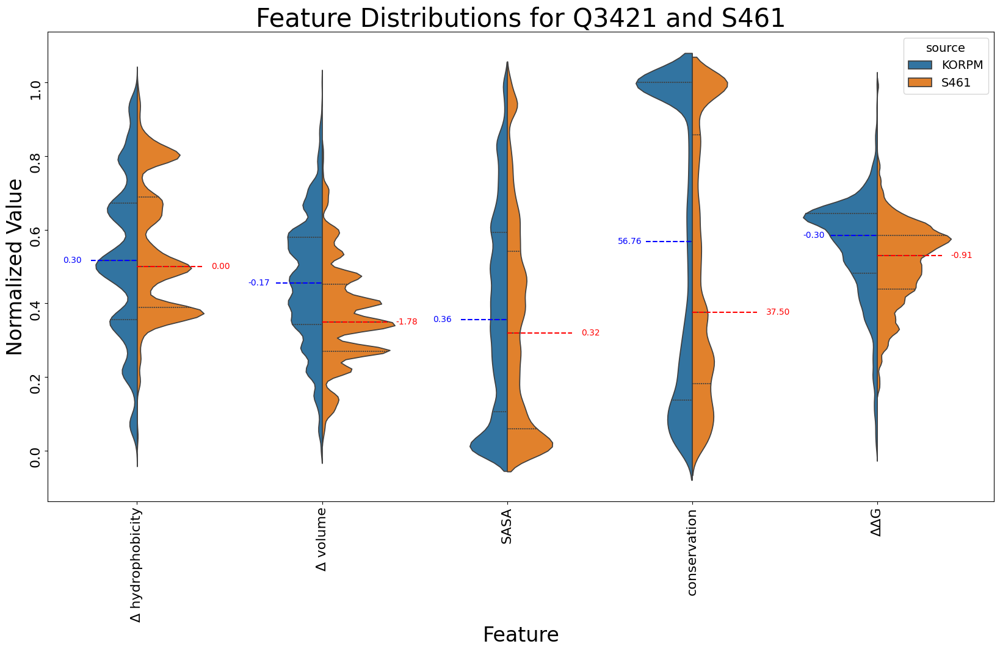

In [ ]:
importlib.reload(analysis_utils)
s461_feats = pd.read_csv(os.path.join(path, 'data', 'analysis', 's461_analysis.csv'))
#compare_distributions_violin(db_feats_2.drop(['n_seqs', 'on_interface', 'column_completeness', 'saltbrs'], axis=1).join(db_ddg), s461_feats, shared_columns=['delta_kdh', 'delta_vol', 'rel_ASA', 'conservation', 'ddG'])
analysis_utils.compare_distributions_violin(db, s461_feats, shared_columns=['delta_kdh_dir', 'delta_vol_dir', 'rel_ASA_dir', 'conservation', 'ddG'], source1='KORPM', label_adjust=0.1)